In [1]:
from fetch_dataframe_from_server import fetch_dataframe_from_server
from cycler import cycler
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np

In [2]:
def compare_losses_and_lambda(sql_statements, legend_names, x_axis_column, y_axis_column, title, data):
    fig, axs = plt.subplots()
    fig.suptitle(title, fontsize=40)
    fig.set_size_inches(25, 10, forward=True)
    axs.grid(linewidth=2)
    #axs.set_prop_cycle(cycler(color=["red", "green", "blue", "purple", "black", "brown", "pink", "gray", "olive"]))
    axs.set_xlim(-0.01, 1.01)
    axs.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    axs.set_xlabel(x_axis_column, fontsize=35)
    axs.set_ylabel(y_axis_column, fontsize=35)
    axs.patch.set_edgecolor("black")
    axs.patch.set_linewidth("2")
    axs.patch.set_edgecolor("black")
    axs.patch.set_linewidth("2")
    line_types = ["--", "-.", ":"]
    graphnumber = 0
    axs.tick_params(axis="both", which="major", labelsize=25)
    for sql_statement, legend_name in zip(sql_statements, legend_names):
        df = fetch_dataframe_from_server(sql_statement)
        axs.plot(df["impact_factor"], df["result"], "*" + line_types[graphnumber % 3], label=legend_name, linewidth=2, markersize = 18)
        graphnumber += 1

    for model_name, model in data.items():
        new_data = []
        for impact_factor, result in sorted(model.items()):
            new_data.append(result)
        axs.plot(list(sorted(model.keys())), new_data,"o" + line_types[graphnumber % 3], label = model_name, linewidth=2, markersize = 15)
        graphnumber += 1
        
    
    plt.legend(fontsize=30, loc="upper center", bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=3, )

    plt.savefig(title + ".png", bbox_inches="tight")


In [3]:
sql = """SELECT scenario_name, approach, metric, impact_factor, ranking_error, borda_score, stopping_criteria, AVG(result) as result
FROM `comparison_to_others_hybrid`
WHERE approach LIKE 'Binary%'
AND ranking_error = '{}'
AND metric = '{}'
AND scenario_name LIKE '{}'
AND stopping_criteria = '{}'
GROUP BY scenario_name, approach, metric, impact_factor, ranking_error, borda_score, stopping_criteria"""

In [4]:
def fill_dict(data, scenario,  value, check_for_quadratic):
    if not scenario in data:
        data[scenario] = {}
    if 'linhinge' in value:
        model_name = 'linear-model_hinge'
    elif 'linpl' in value:
        model_name = 'linear-model_pairwise-preference'
    elif 'nnh' in value:
        model_name = 'neural-network_hinge'
    elif 'plnet' in value:
        model_name = 'neural-network_pairwise-preference'
    
    value = pd.read_csv(value)
    for error in ['par10', 'ndcg', 'performance_regret', 'unsolved']:
        if error == 'par10':
            output_error = 'par10'
        if error == 'ndcg':
            output_error = 'NDCG'
        if error == 'performance_regret':
            output_error = 'performanceRegret'
        if error == 'unsolved':
            output_error = 'number_unsolved_instances_False'
        if not check_for_quadratic:
            if output_error not in data[scenario]:
                data[scenario][output_error] = {}
            data[scenario][output_error][model_name] = {}
            for impact in sorted(value['lambda'].unique()):
                part_df = value[ (value['lambda'] == impact)]
                data[scenario][output_error][model_name][impact] = np.average(part_df[error])
        else:
            if output_error not in data[scenario]:
                data[scenario][output_error] = {}
            data[scenario][output_error][model_name] = {}
            for impact in sorted(value['lambda'].unique()):
                part_df = value[ (value['lambda'] == impact) & (value['quadratic_transform'] == False)]
                data[scenario][output_error][model_name][impact] = np.average(part_df[error])
            new_model_name = model_name.replace('linear','quadratic')
            data[scenario][output_error][new_model_name] = {}
            for impact in sorted(value['lambda'].unique()):
                part_df = value[ (value['lambda'] == impact) & (value['quadratic_transform'] == True)]
                data[scenario][output_error][new_model_name][impact] = np.average(part_df[error])
            

In [5]:
import os
data = {}
for file in os.listdir("./evaluations"):
    
    scenario = '-'.join(file.split('.')[0].split("-")[-2:])
    if 'lin' in file: 
        check_for_quadratic = True
    else:
        check_for_quadratic = False
    
    file = os.path.join("./evaluations", file)
    fill_dict(data, scenario, file, check_for_quadratic)


{'linear-model_hinge': {0.0: 5775.553419987349, 0.1: 5694.165790955091, 0.2: 5600.66758285895, 0.3: 5555.134492093611, 0.4: 5577.394666034155, 0.5: 5534.716655281469, 0.6: 5558.119569576217, 0.7: 5547.714571157495, 0.8: 5558.617491144845, 0.9: 5470.703695762176, 1.0: 5475.768339658444}, 'quadratic-model_hinge': {0.0: 5152.897140733713, 0.1: 4908.171475015813, 0.2: 4788.02612397217, 0.3: 4869.856734661607, 0.4: 5030.095611638204, 0.5: 5038.773135357368, 0.6: 4982.040157495257, 0.7: 5006.273592346616, 0.8: 5090.639679633144, 0.9: 5198.525691334598, 1.0: 5376.943326059457}, 'linear-model_pairwise-preference': {0.0: 5831.332775458571, 0.1: 5661.665164452878, 0.2: 5693.651455724225, 0.3: 5612.2352248576835, 0.4: 5542.649978494624, 0.5: 5497.256546489563, 0.6: 5473.937239721696, 0.7: 5450.709484819735, 0.8: 5429.1105028463, 0.9: 5399.355515496522, 1.0: 5444.272384250474}, 'quadratic-model_pairwise-preference': {0.0: 5363.621149588868, 0.1: 5010.451724857685, 0.2: 4906.769080328905, 0.3: 4806

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

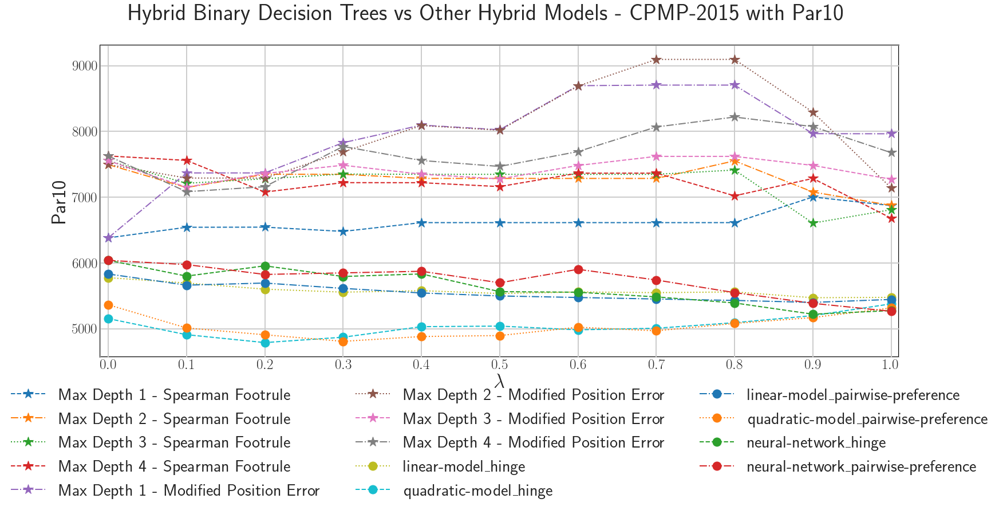

{'linear-model_hinge': {0.0: 5547.948651486401, 0.1: 5466.561022454143, 0.2: 5373.0628143580025, 0.3: 5327.529723592664, 0.4: 5349.789897533208, 0.5: 5307.111886780518, 0.6: 5330.514801075268, 0.7: 5320.109802656547, 0.8: 5331.012722643897, 0.9: 5243.098927261227, 1.0: 5248.163571157495}, 'quadratic-model_hinge': {0.0: 4925.292372232764, 0.1: 4680.566706514865, 0.2: 4560.421355471221, 0.3: 4642.2519661606575, 0.4: 4802.490843137255, 0.5: 4811.168366856421, 0.6: 4754.435388994307, 0.7: 4778.668823845667, 0.8: 4863.034911132195, 0.9: 4970.9209228336495, 1.0: 5149.338557558506}, 'linear-model_pairwise-preference': {0.0: 5603.728006957622, 0.1: 5434.06039595193, 0.2: 5466.046687223276, 0.3: 5384.6304563567355, 0.4: 5315.045209993675, 0.5: 5269.651777988615, 0.6: 5246.332471220747, 0.7: 5223.104716318786, 0.8: 5201.505734345351, 0.9: 5171.750746995573, 1.0: 5216.667615749525}, 'quadratic-model_pairwise-preference': {0.0: 5136.0163810879185, 0.1: 4782.846956356737, 0.2: 4679.164311827957, 0.

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

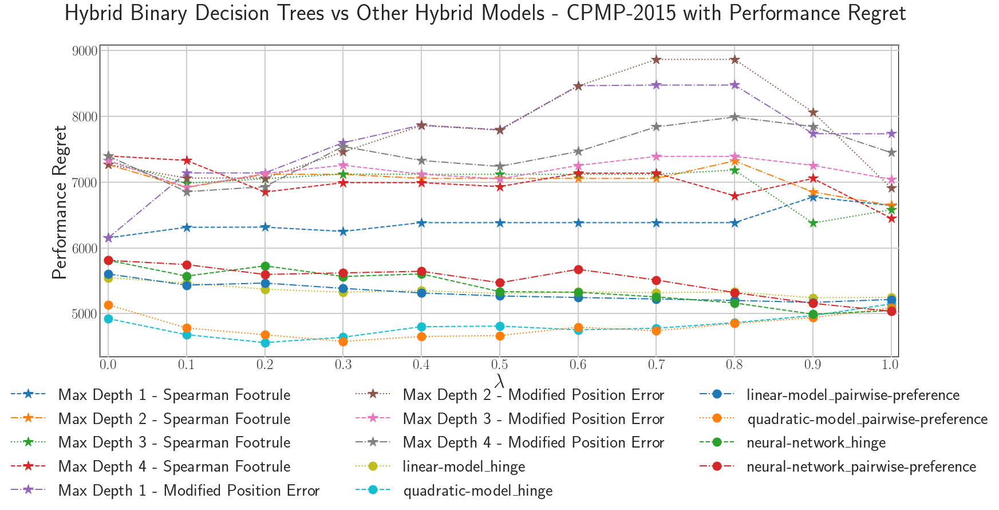

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0009487666034155598}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.00031625553447185326}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0009487666034155598}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.00031625553447185326, 0.1: 0.0, 0.2: 0.00031625553447185326, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.13567362428842505}, 'neural-network_pairwise-preference': {0.0: 0.00031625553447185326, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.08791903858317521}}

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

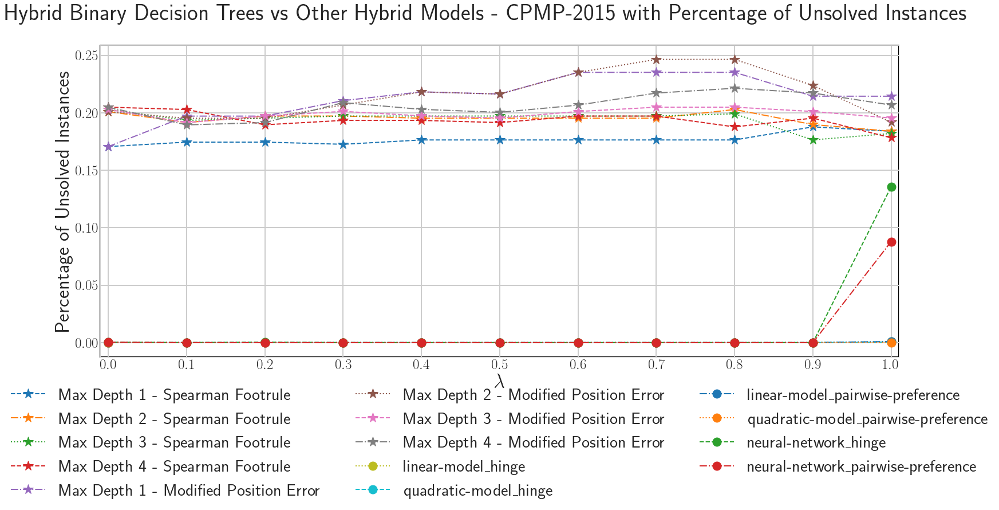

{'linear-model_hinge': {0.0: 0.7379392661969152, 0.1: 0.7277270961390683, 0.2: 0.721163259784387, 0.3: 0.7189229926488265, 0.4: 0.7178887580424398, 0.5: 0.7180047765477385, 0.6: 0.7180325127129427, 0.7: 0.7180888065703903, 0.8: 0.7181134131127692, 0.9: 0.7177435021260932, 1.0: 0.7181059892433053}, 'quadratic-model_hinge': {0.0: 0.739614084136361, 0.1: 0.7280557749865715, 0.2: 0.7186470654418562, 0.3: 0.7152626720371777, 0.4: 0.7152557397457059, 0.5: 0.7159523068688102, 0.6: 0.7168864470551026, 0.7: 0.7179050907776188, 0.8: 0.7193755698506153, 0.9: 0.7213540387307539, 1.0: 0.7237866150215597}, 'linear-model_pairwise-preference': {0.0: 0.7401260642859757, 0.1: 0.7304548845970584, 0.2: 0.7255424248786142, 0.3: 0.7210521498625749, 0.4: 0.7184360280301347, 0.5: 0.717110082859334, 0.6: 0.7163817876611651, 0.7: 0.7159771449265956, 0.8: 0.7156878753712331, 0.9: 0.7157058113263358, 1.0: 0.7193211969284657}, 'quadratic-model_pairwise-preference': {0.0: 0.7413609040770243, 0.1: 0.7321907250560986

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

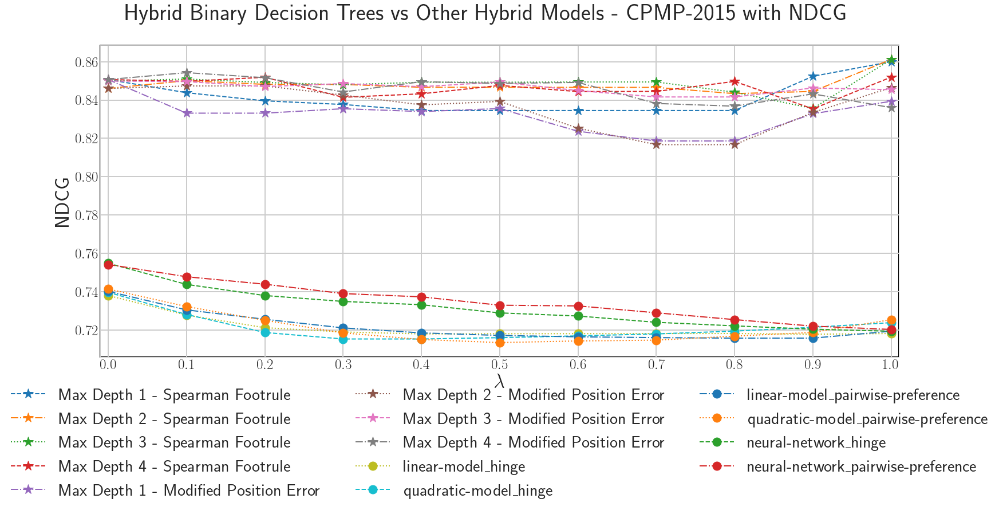

{'linear-model_hinge': {0.0: 5435.391437308868, 0.1: 4698.858562691132, 0.2: 3878.2477064220184, 0.3: 3547.980122324159, 0.4: 3486.34250764526, 0.5: 3370.762996941896, 0.6: 3269.7996941896026, 0.7: 3271.7278287461772, 0.8: 3156.065749235474, 0.9: 3264.048165137615, 1.0: 3207.512996941896}, 'quadratic-model_hinge': {0.0: 6313.128440366972, 0.1: 5494.0978593272175, 0.2: 5104.040519877676, 0.3: 4879.104740061162, 0.4: 4659.920489296636, 0.5: 4647.988532110092, 0.6: 4491.145259938838, 0.7: 4639.977064220184, 0.8: 4867.69877675841, 0.9: 5029.5, 1.0: 4848.569571865443}, 'linear-model_pairwise-preference': {0.0: 5478.483180428135, 0.1: 4860.971712538227, 0.2: 4483.133027522936, 0.3: 4089.8325688073396, 0.4: 3444.8081039755352, 0.5: 3277.8012232415904, 0.6: 3320.136850152905, 0.7: 3261.8600917431195, 0.8: 3424.4388379204893, 0.9: 3368.3119266055046, 1.0: 4224.298165137615}, 'quadratic-model_pairwise-preference': {0.0: 6152.953363914373, 0.1: 5766.059633027523, 0.2: 5223.001529051988, 0.3: 5049

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

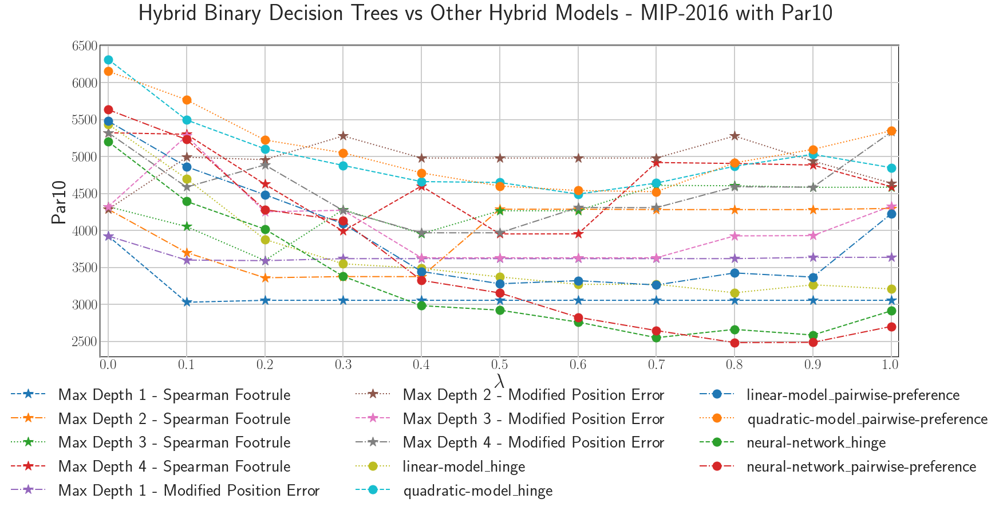

{'linear-model_hinge': {0.0: 5153.873088685015, 0.1: 4417.340214067278, 0.2: 3596.729357798165, 0.3: 3266.461773700306, 0.4: 3204.8241590214066, 0.5: 3089.244648318043, 0.6: 2988.2813455657492, 0.7: 2990.2094801223243, 0.8: 2874.547400611621, 0.9: 2982.5298165137615, 1.0: 2925.994648318043}, 'quadratic-model_hinge': {0.0: 6031.6100917431195, 0.1: 5212.579510703364, 0.2: 4822.522171253822, 0.3: 4597.5863914373085, 0.4: 4378.4021406727825, 0.5: 4366.470183486239, 0.6: 4209.626911314985, 0.7: 4358.45871559633, 0.8: 4586.180428134557, 0.9: 4747.981651376147, 1.0: 4567.05122324159}, 'linear-model_pairwise-preference': {0.0: 5196.964831804281, 0.1: 4579.453363914373, 0.2: 4201.614678899083, 0.3: 3808.314220183486, 0.4: 3163.289755351682, 0.5: 2996.282874617737, 0.6: 3038.618501529052, 0.7: 2980.341743119266, 0.8: 3142.920489296636, 0.9: 3086.793577981651, 1.0: 3942.7798165137615}, 'quadratic-model_pairwise-preference': {0.0: 5871.43501529052, 0.1: 5484.54128440367, 0.2: 4941.483180428135, 0.

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

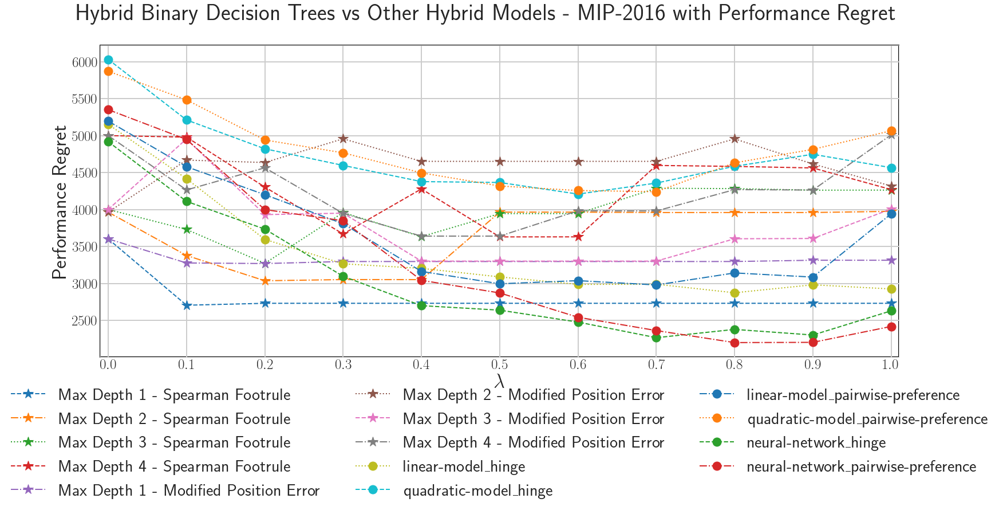

{'linear-model_hinge': {0.0: 0.0061162079510703364, 0.1: 0.0045871559633027525, 0.2: 0.0045871559633027525, 0.3: 0.0045871559633027525, 0.4: 0.0045871559633027525, 0.5: 0.0022935779816513763, 0.6: 0.0015290519877675841, 0.7: 0.0015290519877675841, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.011467889908256881, 0.1: 0.010703363914373088, 0.2: 0.009174311926605505, 0.3: 0.009938837920489297, 0.4: 0.010703363914373088, 0.5: 0.012232415902140673, 0.6: 0.010703363914373088, 0.7: 0.009938837920489297, 0.8: 0.0022935779816513763, 0.9: 0.0015290519877675841, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.00764525993883792, 0.1: 0.0061162079510703364, 0.2: 0.0045871559633027525, 0.3: 0.0045871559633027525, 0.4: 0.0045871559633027525, 0.5: 0.0030581039755351682, 0.6: 0.0030581039755351682, 0.7: 0.0007645259938837921, 0.8: 0.0007645259938837921, 0.9: 0.0007645259938837921, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.012232415902140673, 0.1: 0.009938837920

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

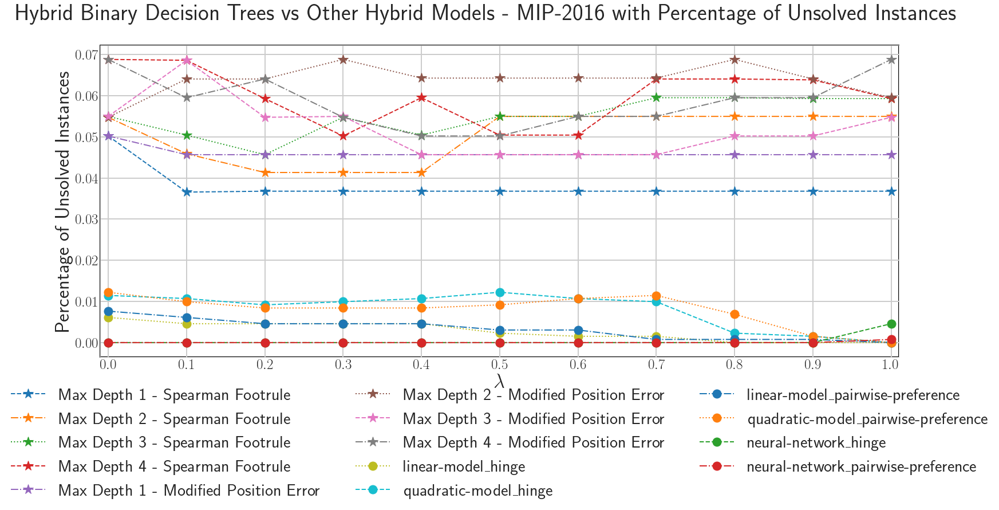

{'linear-model_hinge': {0.0: 0.5979033821684132, 0.1: 0.588499839327546, 0.2: 0.5819837721681403, 0.3: 0.5780821743274835, 0.4: 0.576972015117576, 0.5: 0.5758164635620117, 0.6: 0.5751374740583011, 0.7: 0.5756143302157574, 0.8: 0.574311055269024, 0.9: 0.5743418676380396, 1.0: 0.5743163979801}, 'quadratic-model_hinge': {0.0: 0.6244773038716688, 0.1: 0.6122616769904234, 0.2: 0.6048062928448509, 0.3: 0.5993904345781644, 0.4: 0.5975272278381045, 0.5: 0.5956335052170374, 0.6: 0.5947782458655911, 0.7: 0.5948384963103015, 0.8: 0.5961973854498419, 0.9: 0.597228793775552, 1.0: 0.6037023085231928}, 'linear-model_pairwise-preference': {0.0: 0.6018320762799639, 0.1: 0.5901505019335738, 0.2: 0.5847872040254392, 0.3: 0.5809712895090663, 0.4: 0.5771110114061117, 0.5: 0.5752564054091769, 0.6: 0.5737517084056797, 0.7: 0.5729032869989128, 0.8: 0.5721158107866423, 0.9: 0.5704961131225424, 1.0: 0.5860325513843261}, 'quadratic-model_pairwise-preference': {0.0: 0.6246964440957474, 0.1: 0.6165262445227051, 0.

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

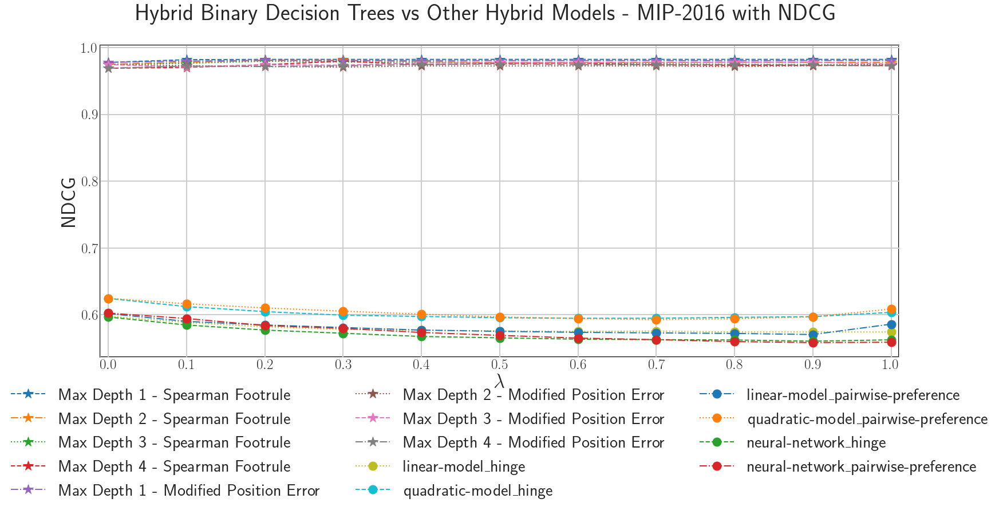

{'linear-model_hinge': {0.0: 6760.079634647233, 0.1: 6658.127959309289, 0.2: 6583.629386358201, 0.3: 6558.918276091403, 0.4: 6534.661938655633, 0.5: 6584.068985602273, 0.6: 6584.068392808795, 0.7: 6633.475460007411, 0.8: 6658.219330232709, 0.9: 6658.219317883893, 1.0: 6634.113703398715}, 'quadratic-model_hinge': {0.0: 6640.0000677460475, 0.1: 6513.245793829546, 0.2: 6466.65579488834, 0.3: 6486.49445630089, 0.4: 6486.494205349308, 0.5: 6486.4944977929845, 0.6: 6511.197747347332, 0.7: 6513.6397531931825, 0.8: 6585.369643843874, 0.9: 6511.258814816205, 1.0: 6461.8549195627465}, 'linear-model_pairwise-preference': {0.0: 6689.7256194925885, 0.1: 6732.3849939629445, 0.2: 6635.84565346838, 0.3: 6657.631301608695, 0.4: 6633.02425630237, 0.5: 6583.767771563241, 0.6: 6633.1747537949595, 0.7: 6657.882513535079, 0.8: 6633.625694951087, 0.9: 6633.684806516305, 1.0: 6634.185691423419}, 'quadratic-model_pairwise-preference': {0.0: 6664.75609897579, 0.1: 6536.73989689328, 0.2: 6489.356081847825, 0.3: 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

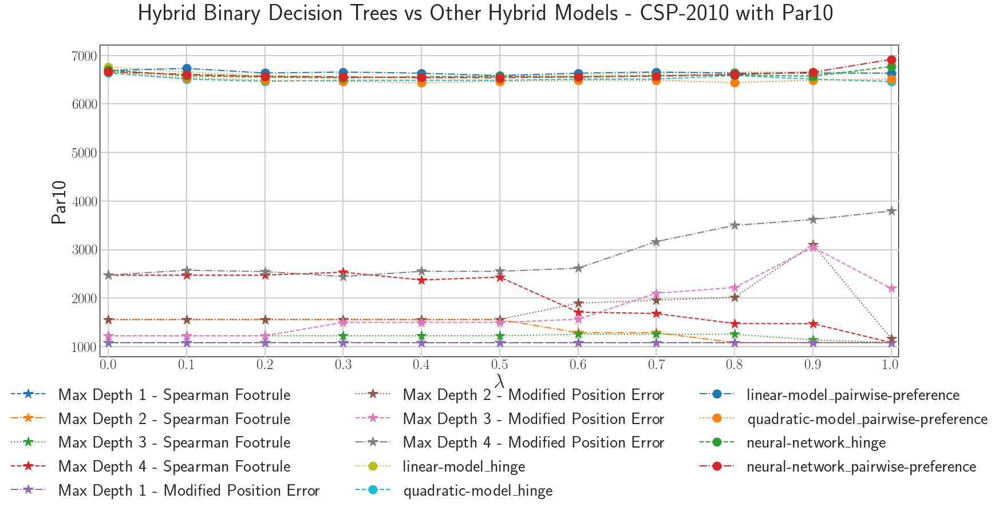

{'linear-model_hinge': {0.0: 415.82842803211463, 0.1: 313.87675269416997, 0.2: 239.37817974308302, 0.3: 214.66706947628455, 0.4: 190.41073204051384, 0.5: 239.81777898715416, 0.6: 239.8171861936759, 0.7: 289.2242533922925, 0.8: 313.9681236175889, 0.9: 313.9681112687747, 1.0: 289.86249678359684}, 'quadratic-model_hinge': {0.0: 295.74886113092884, 0.1: 168.9945872144269, 0.2: 122.40458827322135, 0.3: 142.24324968577076, 0.4: 142.2429987341897, 0.5: 142.24329117786561, 0.6: 166.94654073221344, 0.7: 169.38854657806326, 0.8: 241.1184372287549, 0.9: 167.00760820108695, 1.0: 117.60371294762847}, 'linear-model_pairwise-preference': {0.0: 345.4744128774704, 0.1: 388.1337873478261, 0.2: 291.5944468532608, 0.3: 313.380094993577, 0.4: 288.77304968725304, 0.5: 239.51656494812252, 0.6: 288.9235471798419, 0.7: 313.6313069199605, 0.8: 289.3744883359684, 0.9: 289.43359990118574, 1.0: 289.93448480830034}, 'quadratic-model_pairwise-preference': {0.0: 320.50489236067193, 0.1: 192.48869027816207, 0.2: 145.1

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

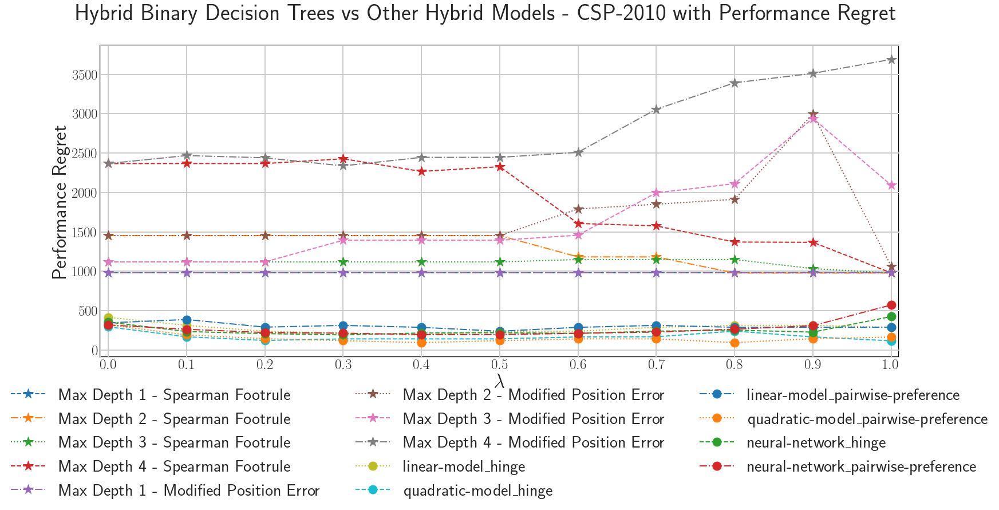

{'linear-model_hinge': {0.0: 0.001976284584980237, 0.1: 0.001976284584980237, 0.2: 0.001976284584980237, 0.3: 0.0014822134387351778, 0.4: 0.0009881422924901185, 0.5: 0.0009881422924901185, 0.6: 0.0004940711462450593, 0.7: 0.0004940711462450593, 0.8: 0.0, 0.9: 0.0, 1.0: 0.02717391304347826}, 'quadratic-model_hinge': {0.0: 0.011857707509881422, 0.1: 0.012845849802371542, 0.2: 0.012845849802371542, 0.3: 0.011363636363636364, 0.4: 0.011857707509881422, 0.5: 0.010869565217391304, 0.6: 0.011363636363636364, 0.7: 0.009387351778656126, 0.8: 0.007905138339920948, 0.9: 0.010869565217391304, 1.0: 0.01432806324110672}, 'linear-model_pairwise-preference': {0.0: 0.0029644268774703555, 0.1: 0.001976284584980237, 0.2: 0.0014822134387351778, 0.3: 0.0014822134387351778, 0.4: 0.0009881422924901185, 0.5: 0.0004940711462450593, 0.6: 0.0004940711462450593, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.017292490118577076}, 'quadratic-model_pairwise-preference': {0.0: 0.011857707509881422, 0.1: 0.012351778656126482, 0

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

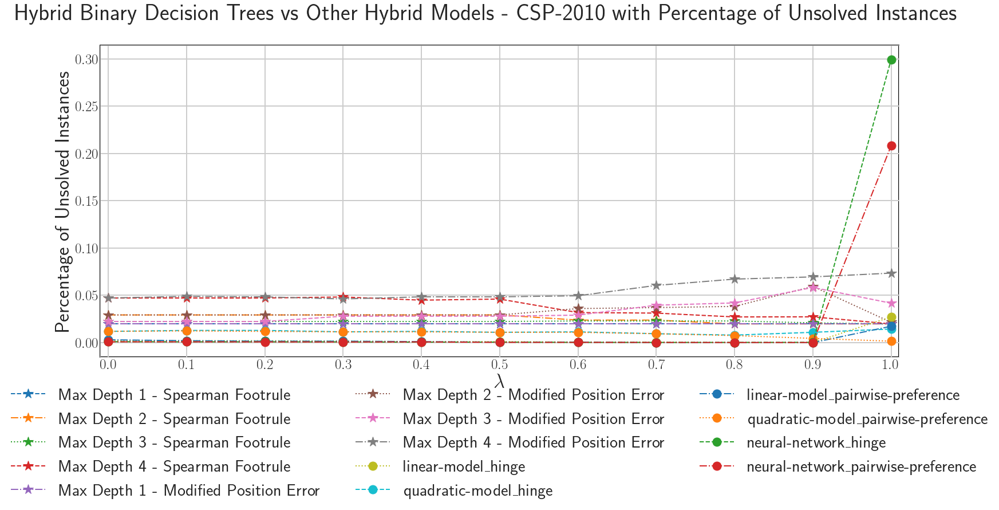

{'linear-model_hinge': {0.0: 0.7602693759440085, 0.1: 0.7336467198281156, 0.2: 0.7285410049565744, 0.3: 0.727629270158085, 0.4: 0.7261704944805019, 0.5: 0.7258058005611061, 0.6: 0.7252587596820123, 0.7: 0.7258058005611061, 0.8: 0.7256234536014081, 0.9: 0.7258058005611061, 1.0: 0.7265351883998975}, 'quadratic-model_hinge': {0.0: 0.7834274398256412, 0.1: 0.7296350867147617, 0.2: 0.729452739755064, 0.3: 0.7283586579968766, 0.4: 0.7283586579968766, 0.5: 0.7283586579968766, 0.6: 0.7279939640774808, 0.7: 0.7276292701580849, 0.8: 0.7276292701580849, 0.9: 0.7270822292789911, 1.0: 0.7254411066417102}, 'linear-model_pairwise-preference': {0.0: 0.7668338664931327, 0.1: 0.7374760059817713, 0.2: 0.7305468215132513, 0.3: 0.7294527397550639, 0.4: 0.7270822292789911, 0.5: 0.7263528414401997, 0.6: 0.7258058005611061, 0.7: 0.7261704944805019, 0.8: 0.7259881475208038, 0.9: 0.7268998823192935, 1.0: 0.7261704944805019}, 'quadratic-model_pairwise-preference': {0.0: 0.782151011107756, 0.1: 0.734740801586303,

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

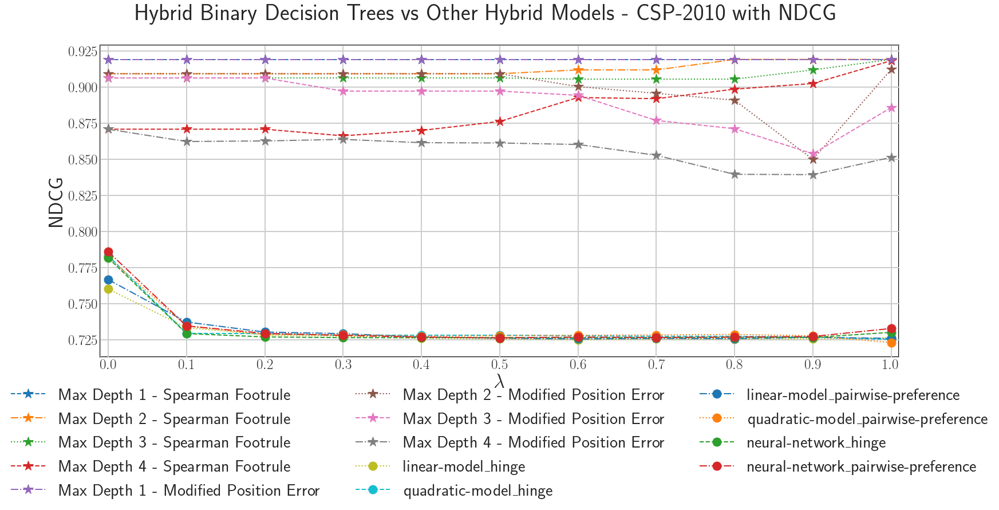

{'linear-model_hinge': {0.0: 22412.213622021958, 0.1: 22164.216221047296, 0.2: 21967.422070712273, 0.3: 21697.229106427927, 0.4: 21500.14721293919, 0.5: 21358.385175724103, 0.6: 21551.265096364303, 0.7: 21632.06102994482, 0.8: 21536.6199700107, 0.9: 21598.151277894147, 1.0: 21400.196781579958}, 'quadratic-model_hinge': {0.0: 21939.9869861723, 0.1: 21471.391267725223, 0.2: 21259.315310311373, 0.3: 21279.309913929617, 0.4: 21478.46642347973, 0.5: 21530.652742195947, 0.6: 21560.61030126295, 0.7: 21319.6656485518, 0.8: 21432.8307341357, 0.9: 21392.607261012392, 1.0: 20274.549949154283}, 'linear-model_pairwise-preference': {0.0: 24179.07829396847, 0.1: 21613.32559045045, 0.2: 21466.19065950169, 0.3: 21161.456650992117, 0.4: 20861.743026396394, 0.5: 20640.872232545607, 0.6: 20496.603373695383, 0.7: 20578.98016549381, 0.8: 20249.20251022241, 0.9: 19955.002047884573, 1.0: 21154.930732954395}, 'quadratic-model_pairwise-preference': {0.0: 21947.828931550677, 0.1: 21711.808486376125, 0.2: 21279.2

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

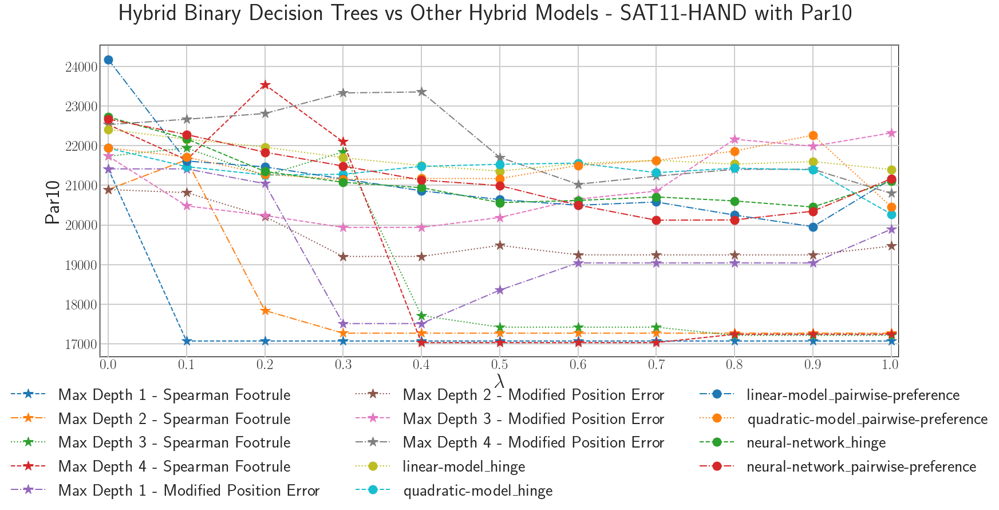

{'linear-model_hinge': {0.0: 9051.549683451012, 0.1: 8803.55228247635, 0.2: 8606.758132141329, 0.3: 8336.565167856981, 0.4: 8139.483274368243, 0.5: 7997.721237153152, 0.6: 8190.601157793356, 0.7: 8271.397091373874, 0.8: 8175.956031439752, 0.9: 8237.487339323197, 1.0: 8039.5328430090085}, 'quadratic-model_hinge': {0.0: 8579.323047601352, 0.1: 8110.727329154279, 0.2: 7898.651371740428, 0.3: 7918.645975358672, 0.4: 8117.802484908783, 0.5: 8169.9888036249995, 0.6: 8199.946362692004, 0.7: 7959.0017099808565, 0.8: 8072.166795564753, 0.9: 8031.943322441442, 1.0: 6913.886010583333}, 'linear-model_pairwise-preference': {0.0: 10818.414355397523, 0.1: 8252.661651879505, 0.2: 8105.526720930744, 0.3: 7800.792712421171, 0.4: 7501.07908782545, 0.5: 7280.2082939746615, 0.6: 7135.939435124437, 0.7: 7218.316226922861, 0.8: 6888.538571651463, 0.9: 6594.338109313626, 1.0: 7794.266794383446}, 'quadratic-model_pairwise-preference': {0.0: 8587.16499297973, 0.1: 8351.14454780518, 0.2: 7918.605823907095, 0.3: 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

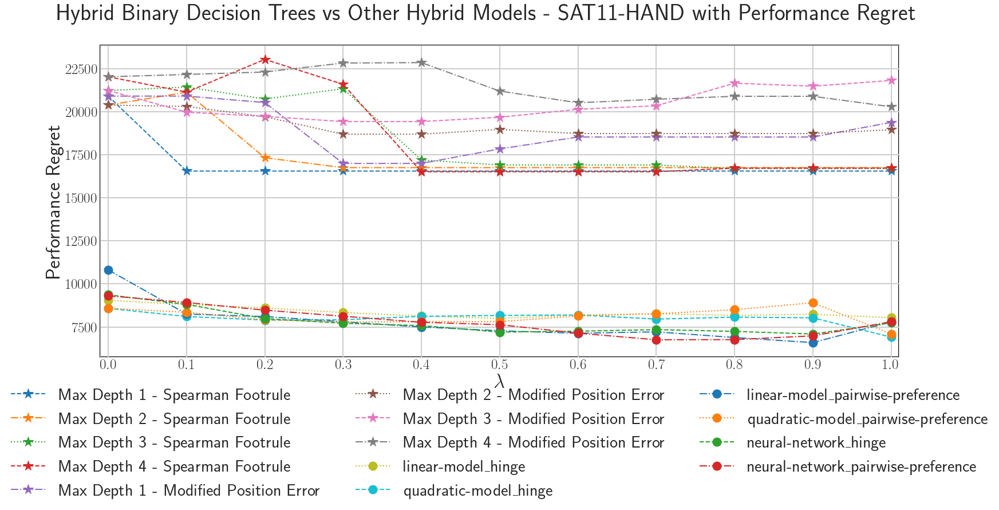

{'linear-model_hinge': {0.0: 0.0005630630630630631, 0.1: 0.0005630630630630631, 0.2: 0.0005630630630630631, 0.3: 0.0005630630630630631, 0.4: 0.0005630630630630631, 0.5: 0.0005630630630630631, 0.6: 0.0005630630630630631, 0.7: 0.0005630630630630631, 0.8: 0.0005630630630630631, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.028153153153153154, 0.1: 0.0259009009009009, 0.2: 0.023085585585585586, 0.3: 0.019707207207207207, 0.4: 0.018581081081081082, 0.5: 0.01463963963963964, 0.6: 0.013513513513513514, 0.7: 0.009572072072072071, 0.8: 0.009009009009009009, 0.9: 0.006193693693693694, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0005630630630630631, 0.2: 0.0005630630630630631, 0.3: 0.0005630630630630631, 0.4: 0.0005630630630630631, 0.5: 0.0005630630630630631, 0.6: 0.0005630630630630631, 0.7: 0.0005630630630630631, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.028153153153153154, 0.1: 0.02702702702702703, 0.2: 0.02364864864864865, 0.3: 0

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

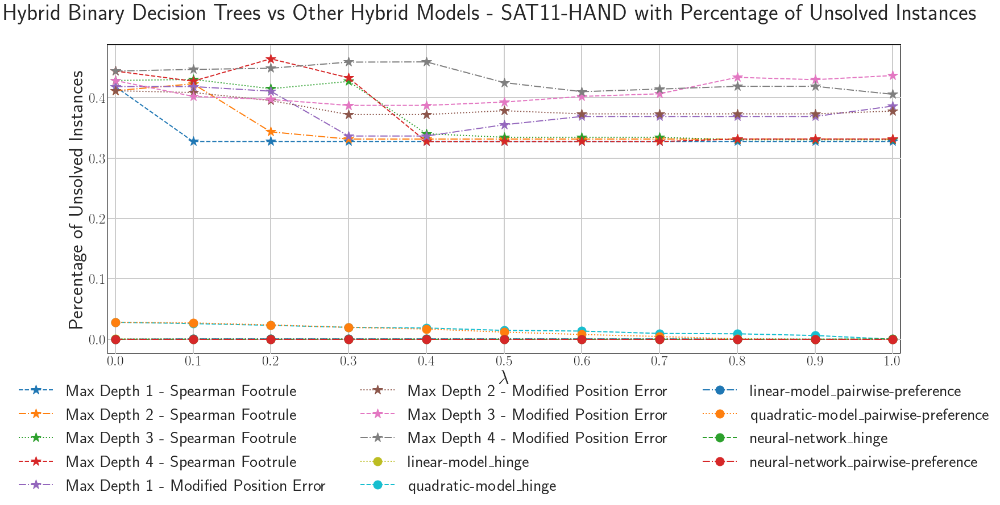

{'linear-model_hinge': {0.0: 0.9190560159669582, 0.1: 0.9110510661853778, 0.2: 0.9074220874578791, 0.3: 0.9062210842453712, 0.4: 0.9053199600691693, 0.5: 0.9045335610948532, 0.6: 0.904968643185957, 0.7: 0.9048939577843346, 0.8: 0.9057113236923647, 0.9: 0.90610139608807, 1.0: 0.9049500628734549}, 'quadratic-model_hinge': {0.0: 0.9219523082980473, 0.1: 0.9149127432482475, 0.2: 0.9129498096014441, 0.3: 0.9116138822954041, 0.4: 0.9116417016126853, 0.5: 0.91170331176896, 0.6: 0.911055390720484, 0.7: 0.9115787902507614, 0.8: 0.9106346342701369, 0.9: 0.9101536061882727, 1.0: 0.9007512525744967}, 'linear-model_pairwise-preference': {0.0: 0.926294288036927, 0.1: 0.9112069547864504, 0.2: 0.9066885092387181, 0.3: 0.9036052230694118, 0.4: 0.90149196180891, 0.5: 0.9004654464687779, 0.6: 0.8990672855141382, 0.7: 0.8988112786048448, 0.8: 0.8980822806567857, 0.9: 0.8969721285102021, 1.0: 0.9056656474455044}, 'quadratic-model_pairwise-preference': {0.0: 0.9223539960361652, 0.1: 0.9170521279187211, 0.2:

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

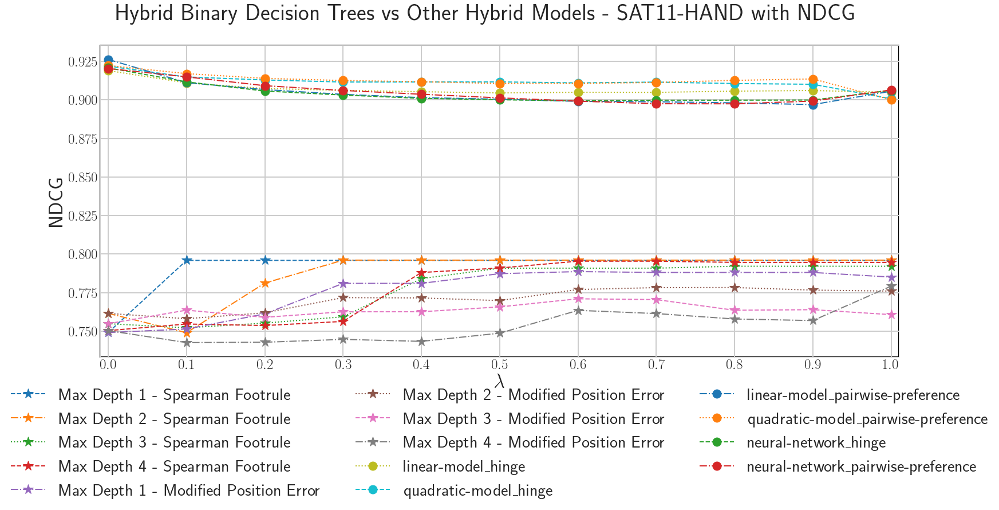

{'linear-model_hinge': {0.0: 16578.592875369442, 0.1: 16466.122406186667, 0.2: 16462.476670822223, 0.3: 16295.569376676665, 0.4: 16323.334658013335, 0.5: 16179.388712762222, 0.6: 16042.811890411667, 0.7: 16253.626066532222, 0.8: 16439.668892381666, 0.9: 16034.347412150557, 1.0: 15011.50948422}, 'quadratic-model_hinge': {0.0: 15281.54583526, 0.1: 15013.620091493889, 0.2: 14791.302195376113, 0.3: 14919.818675947223, 0.4: 14882.200141510555, 0.5: 14858.075942335001, 0.6: 14914.876668889445, 0.7: 15079.379337704444, 0.8: 14869.186039887778, 0.9: 14879.555502736668, 1.0: 14547.891668159444}, 'linear-model_pairwise-preference': {0.0: 16690.946821507776, 0.1: 16289.548424119444, 0.2: 16246.75203526222, 0.3: 16191.72595755778, 0.4: 15854.301792028333, 0.5: 15849.048436042222, 0.6: 15629.883998031666, 0.7: 15528.525334152222, 0.8: 15430.371151542777, 0.9: 14922.887535375, 1.0: 14761.516259789443}, 'quadratic-model_pairwise-preference': {0.0: 15383.757235746667, 0.1: 15098.355219982222, 0.2: 149

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

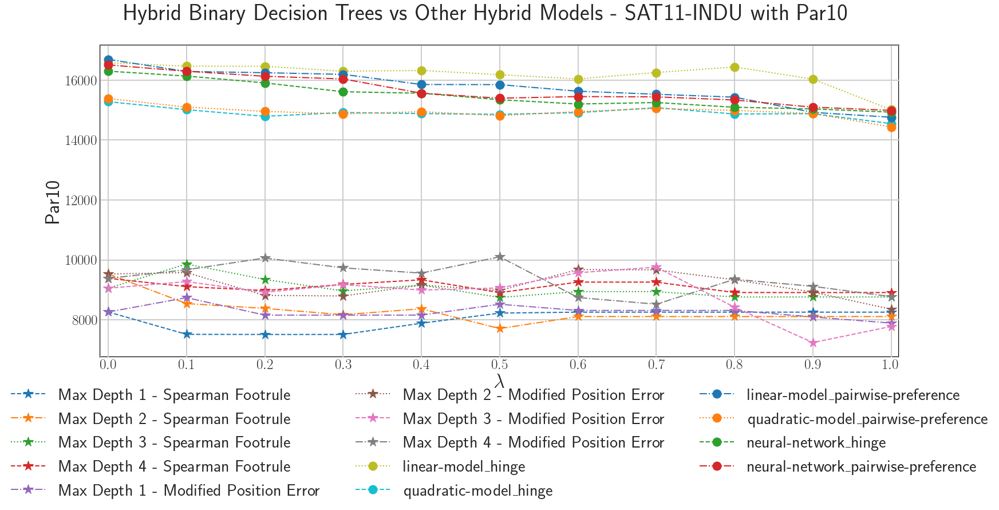

{'linear-model_hinge': {0.0: 8391.075057162778, 0.1: 8278.60458798, 0.2: 8274.958852615557, 0.3: 8108.05155847, 0.4: 8135.816839806667, 0.5: 7991.870894555555, 0.6: 7855.294072205, 0.7: 8066.108248325555, 0.8: 8252.151074175, 0.9: 7846.829593943889, 1.0: 6823.991666013333}, 'quadratic-model_hinge': {0.0: 7094.028017053333, 0.1: 6826.102273287222, 0.2: 6603.784377169444, 0.3: 6732.300857740556, 0.4: 6694.6823233038895, 0.5: 6670.5581241283335, 0.6: 6727.358850682778, 0.7: 6891.861519497777, 0.8: 6681.6682216811105, 0.9: 6692.037684529999, 1.0: 6360.373849952778}, 'linear-model_pairwise-preference': {0.0: 8503.429003301111, 0.1: 8102.030605912778, 0.2: 8059.234217055556, 0.3: 8004.208139351112, 0.4: 7666.783973821666, 0.5: 7661.530617835556, 0.6: 7442.3661798250005, 0.7: 7341.0075159455555, 0.8: 7242.853333336111, 0.9: 6735.369717168333, 1.0: 6573.998441582778}, 'quadratic-model_pairwise-preference': {0.0: 7196.23941754, 0.1: 6910.837401775555, 0.2: 6769.407611766666, 0.3: 6687.302529771

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

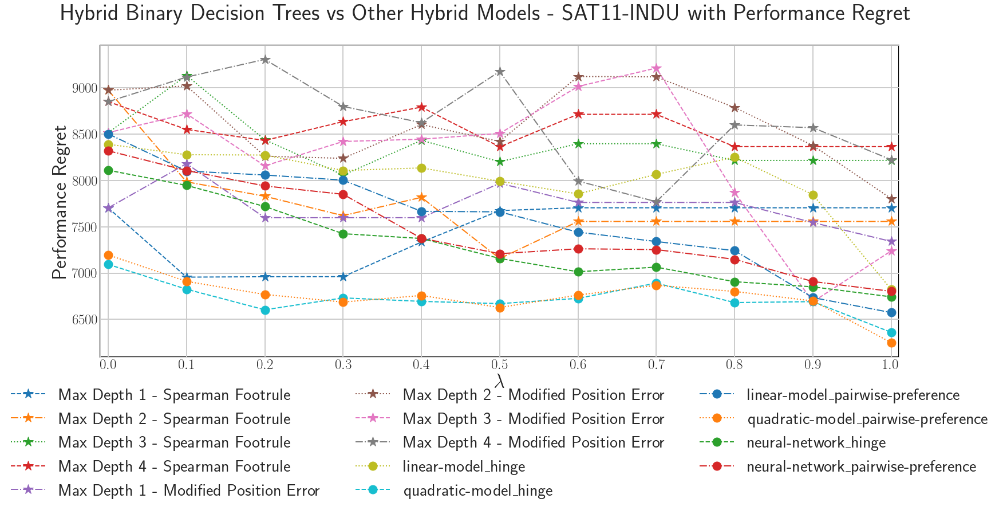

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.023333333333333334, 0.1: 0.02388888888888889, 0.2: 0.02277777777777778, 0.3: 0.020555555555555556, 0.4: 0.02, 0.5: 0.019444444444444445, 0.6: 0.02, 0.7: 0.019444444444444445, 0.8: 0.017777777777777778, 0.9: 0.015555555555555555, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.023333333333333334, 0.1: 0.024444444444444446, 0.2: 0.023333333333333334, 0.3: 0.021111111111111112, 0.4: 0.02, 0.5: 0.019444444444444445, 0.6: 0.017222222222222222, 0.7: 0.012222222222222223, 0.8: 0.008888888888888889, 0.9: 0.002777777777777778, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0011111

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

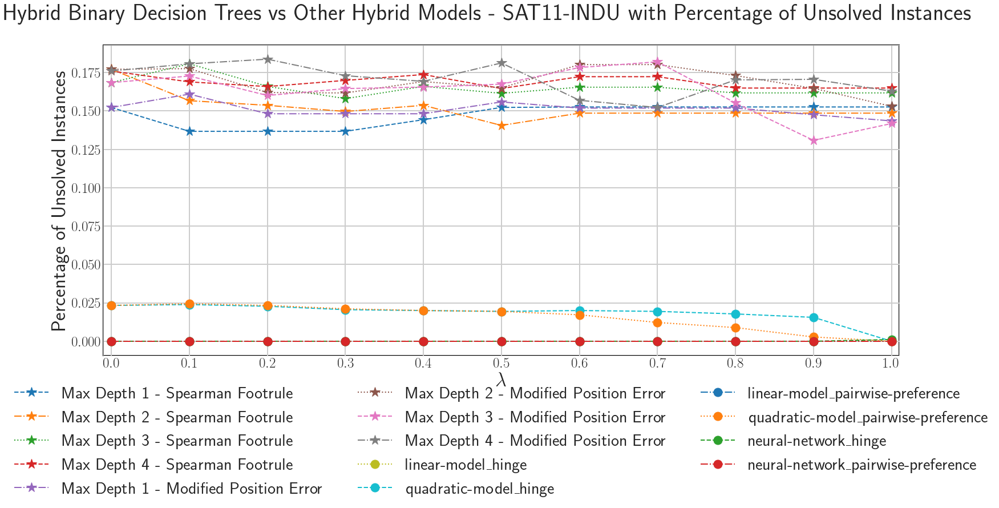

{'linear-model_hinge': {0.0: 0.8294191843884818, 0.1: 0.8213096161267812, 0.2: 0.8167590698193974, 0.3: 0.8129085151844935, 0.4: 0.8116748833708066, 0.5: 0.8100893743956746, 0.6: 0.8096176154357717, 0.7: 0.8095932068167134, 0.8: 0.8090413392203651, 0.9: 0.8074655355251474, 1.0: 0.8058603396102739}, 'quadratic-model_hinge': {0.0: 0.8217955263547629, 0.1: 0.815790348772712, 0.2: 0.8108677709147857, 0.3: 0.8090938662538686, 0.4: 0.8075798672012922, 0.5: 0.8070682814212174, 0.6: 0.8062656885758154, 0.7: 0.8057343192741814, 0.8: 0.8045947384093617, 0.9: 0.8043212568912101, 1.0: 0.8036018078344519}, 'linear-model_pairwise-preference': {0.0: 0.8327686982820468, 0.1: 0.8212172022801861, 0.2: 0.8173881174281598, 0.3: 0.8134711459951722, 0.4: 0.8096390723252049, 0.5: 0.8074249697615177, 0.6: 0.8053786311309368, 0.7: 0.8050442980596406, 0.8: 0.8035796495386855, 0.9: 0.8023290931697796, 1.0: 0.807465645679288}, 'quadratic-model_pairwise-preference': {0.0: 0.8214502123013216, 0.1: 0.818202758416915

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

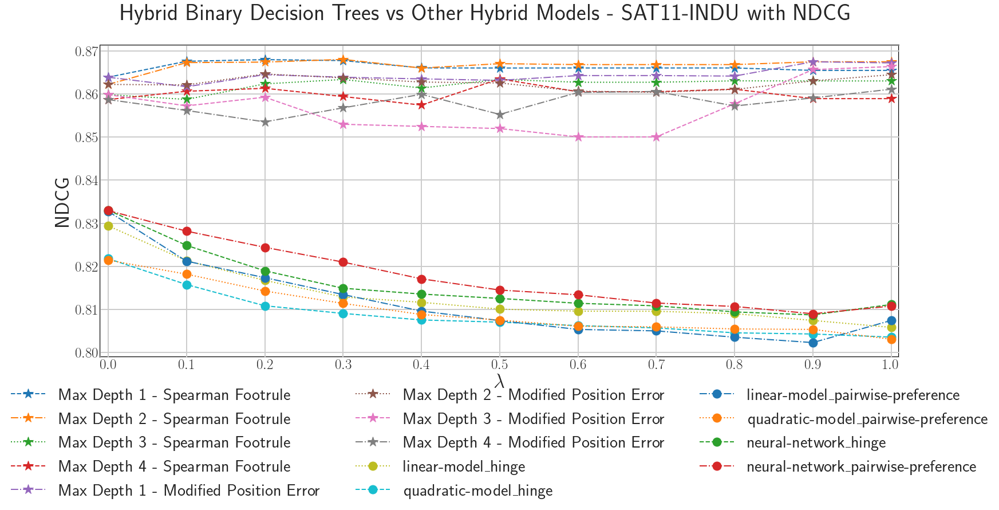

{'linear-model_hinge': {0.0: 11599.815620568332, 0.1: 11662.53674503889, 0.2: 11903.696930816946, 0.3: 12221.222610951112, 0.4: 12385.485087055833, 0.5: 12555.15157296028, 0.6: 12723.24593277361, 0.7: 13029.84508613139, 0.8: 13154.39963787139, 0.9: 13270.485644618335, 1.0: 13012.558269191944}, 'quadratic-model_hinge': {0.0: 11681.21303062889, 0.1: 11796.136101305556, 0.2: 12068.364090660001, 0.3: 12231.099321221667, 0.4: 12537.953396784998, 0.5: 12842.45085360861, 0.6: 13145.165427950276, 0.7: 13357.165651034444, 0.8: 13632.888939949444, 0.9: 13873.095094811666, 1.0: 13887.774824589169}, 'linear-model_pairwise-preference': {0.0: 11772.545766989444, 0.1: 11426.141095698335, 0.2: 11532.997781046111, 0.3: 11518.613956350833, 0.4: 11640.958686852779, 0.5: 11802.095486292223, 0.6: 11964.339179433055, 0.7: 12156.4897788525, 0.8: 12296.066688617779, 0.9: 12544.81498586722, 1.0: 13075.70644426722}, 'quadratic-model_pairwise-preference': {0.0: 11681.084625739444, 0.1: 11849.880208357778, 0.2: 1

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

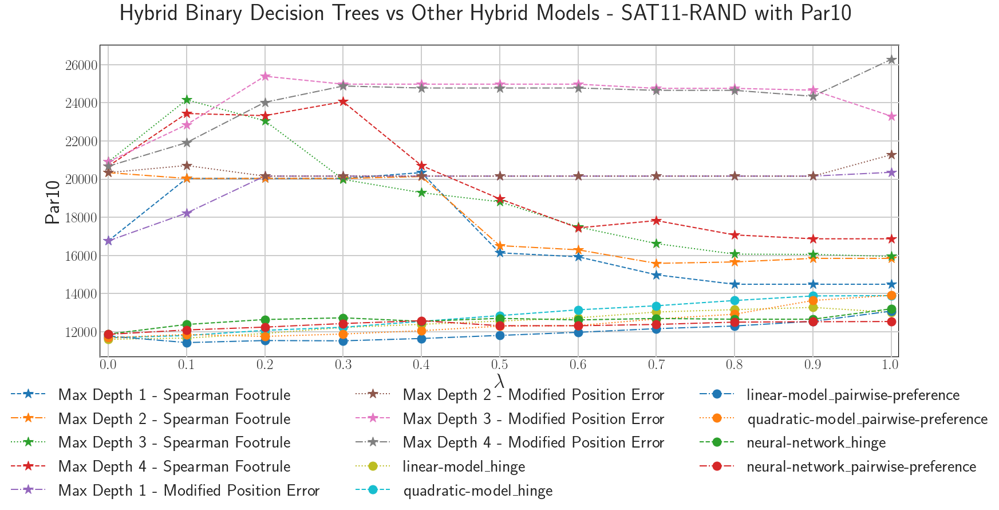

{'linear-model_hinge': {0.0: 2413.375055565, 0.1: 2476.096180035556, 0.2: 2717.256365813611, 0.3: 3034.782045947778, 0.4: 3199.0445220525003, 0.5: 3368.7110079569443, 0.6: 3536.805367770278, 0.7: 3843.4045211280554, 0.8: 3967.959072868055, 0.9: 4084.045079615, 1.0: 3826.1177041886117}, 'quadratic-model_hinge': {0.0: 2494.772465625556, 0.1: 2609.695536302222, 0.2: 2881.9235256566667, 0.3: 3044.658756218333, 0.4: 3351.512831781667, 0.5: 3656.0102886052778, 0.6: 3958.7248629469445, 0.7: 4170.7250860311115, 0.8: 4446.4483749461115, 0.9: 4686.654529808334, 1.0: 4701.334259585833}, 'linear-model_pairwise-preference': {0.0: 2586.1052019861113, 0.1: 2239.700530695, 0.2: 2346.557216042778, 0.3: 2332.1733913475, 0.4: 2454.5181218494445, 0.5: 2615.6549212888885, 0.6: 2777.8986144297223, 0.7: 2970.0492138491663, 0.8: 3109.6261236144446, 0.9: 3358.374420863889, 1.0: 3889.2658792638886}, 'quadratic-model_pairwise-preference': {0.0: 2494.6440607361114, 0.1: 2663.439643354444, 0.2: 2565.774407806945, 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

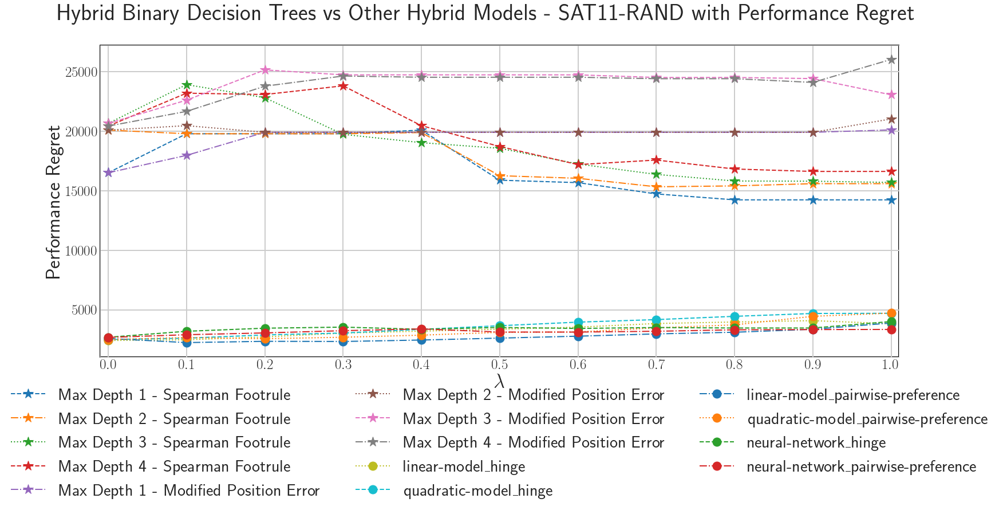

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.05, 0.1: 0.05, 0.2: 0.05, 0.3: 0.05, 0.4: 0.05, 0.5: 0.05, 0.6: 0.05, 0.7: 0.05, 0.8: 0.050277777777777775, 0.9: 0.028888888888888888, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.05, 0.1: 0.05, 0.2: 0.05, 0.3: 0.05, 0.4: 0.05, 0.5: 0.05, 0.6: 0.05, 0.7: 0.05, 0.8: 0.05, 0.9: 0.028333333333333332, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.16472222222222221}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.06194444444444445}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

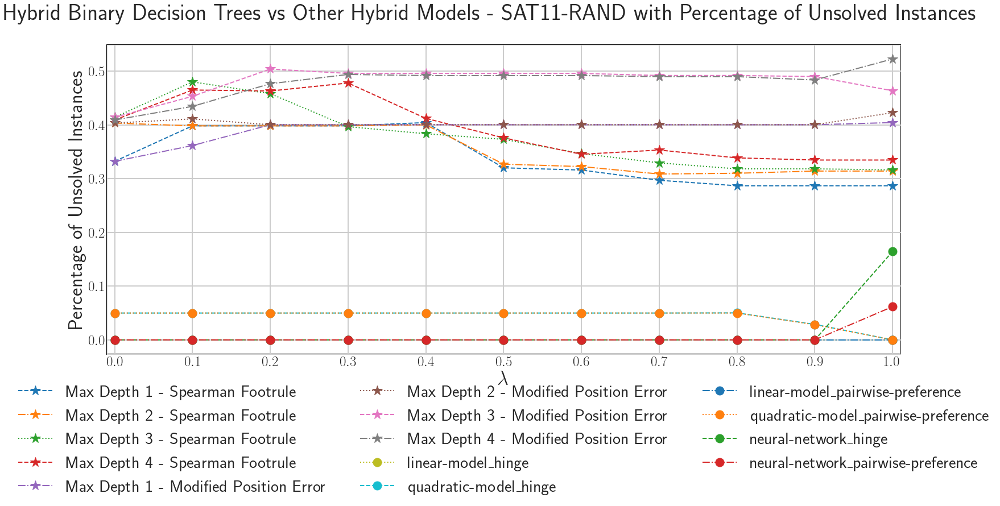

{'linear-model_hinge': {0.0: 0.7675082166051839, 0.1: 0.7637292757991767, 0.2: 0.7614231402687669, 0.3: 0.7612934449939845, 0.4: 0.7603611096018332, 0.5: 0.7607058153593388, 0.6: 0.7614870685249088, 0.7: 0.762829575364437, 0.8: 0.7638368771734746, 0.9: 0.7647810277395932, 1.0: 0.7629272142684405}, 'quadratic-model_hinge': {0.0: 0.768676468150515, 0.1: 0.7662968873996016, 0.2: 0.7652071095693718, 0.3: 0.763672835421526, 0.4: 0.7633592194797152, 0.5: 0.7640480743086052, 0.6: 0.7643872389302079, 0.7: 0.7650999421311355, 0.8: 0.7661952599260982, 0.9: 0.7678259186502121, 1.0: 0.7692168200959741}, 'linear-model_pairwise-preference': {0.0: 0.7671956533646959, 0.1: 0.7660463201116944, 0.2: 0.7645320163618221, 0.3: 0.7626182233286921, 0.4: 0.7617664255174689, 0.5: 0.7618786929455038, 0.6: 0.7615289338875083, 0.7: 0.7622067397466927, 0.8: 0.7630390416127852, 0.9: 0.7640845672921268, 1.0: 0.7627580162690254}, 'quadratic-model_pairwise-preference': {0.0: 0.7691041083148745, 0.1: 0.7671416510576804

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

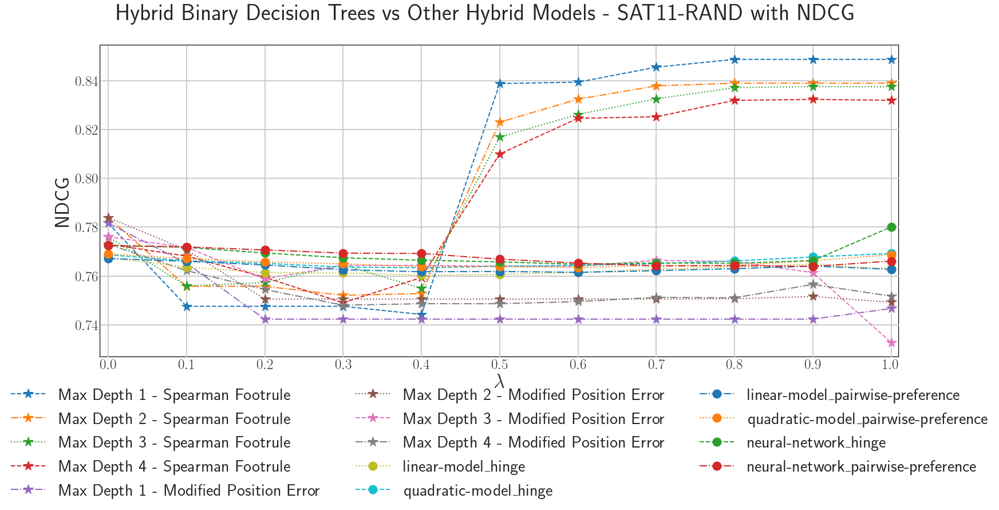

In [6]:
scenario_names = ['CPMP-2015','MIP-2016','CSP-2010','SAT11-HAND','SAT11-INDU','SAT11-RAND']
ranking_losses = ['corrected_spearman_footrule','modified_position_error']
ranking_loss_names = ['Max Depth 1 - Spearman Footrule','Max Depth 2 - Spearman Footrule','Max Depth 3 - Spearman Footrule', 'Max Depth 4 - Spearman Footrule', 'Max Depth 1 - Modified Position Error','Max Depth 2 - Modified Position Error','Max Depth 3 - Modified Position Error', 'Max Depth 4 - Modified Position Error']
stopping_criteria = ['max_depth_1', 'max_depth_2', 'max_depth_3', 'max_depth_4']
for scenario_name in scenario_names:
    for metric_name in ['par10',  'performanceRegret','number_unsolved_instances_False', 'NDCG']:
        metric_name_graph = None
        sql_trees = [sql.format(ranking_loss, metric_name, scenario_name,stopping_criterion) for ranking_loss in ranking_losses for stopping_criterion in stopping_criteria]
        if metric_name == 'par10':
            metric_name_graph = 'Par10'
        if metric_name == 'performanceRegret':
            metric_name_graph = 'Performance Regret'
        if metric_name == 'number_unsolved_instances_False':
            metric_name_graph = 'Percentage of Unsolved Instances'
        if metric_name == 'NDCG':
            metric_name_graph = 'NDCG'
        title = f"Hybrid Binary Decision Trees vs Other Hybrid Models - {scenario_name} with {metric_name_graph}"
        print(data[scenario_name][metric_name])
        compare_losses_and_lambda(sql_trees, ranking_loss_names,r"$\lambda$", metric_name_graph,title, data[scenario_name][metric_name])
        plt.show()

In [7]:
import os
data = {}
for file in os.listdir("./evaluations_reworked"):
    
    scenario = '-'.join(file.split('.')[0].split("-")[-2:])
    if 'lin' in file: 
        check_for_quadratic = True
    else:
        check_for_quadratic = False
    
    file = os.path.join("./evaluations_reworked", file)
    fill_dict(data, scenario, file, check_for_quadratic)

{'linear-model_hinge': {0.0: 227.60476850094875, 0.1: 227.60476850094875, 0.2: 227.60476850094875, 0.3: 227.60476850094875, 0.4: 227.60476850094875, 0.5: 227.60476850094875, 0.6: 227.60476850094875, 0.7: 227.60476850094875, 0.8: 227.60476850094875, 0.9: 227.60476850094875, 1.0: 227.60476850094875}, 'quadratic-model_hinge': {0.0: 227.60476850094875, 0.1: 227.60476850094875, 0.2: 227.60476850094875, 0.3: 227.60476850094875, 0.4: 227.60476850094875, 0.5: 227.60476850094875, 0.6: 227.60476850094875, 0.7: 227.60476850094875, 0.8: 227.60476850094875, 0.9: 227.60476850094875, 1.0: 227.60476850094875}, 'linear-model_pairwise-preference': {0.0: 227.60476850094875, 0.1: 227.60476850094875, 0.2: 227.60476850094875, 0.3: 227.60476850094875, 0.4: 227.60476850094875, 0.5: 227.60476850094875, 0.6: 227.60476850094875, 0.7: 227.60476850094875, 0.8: 227.60476850094875, 0.9: 227.60476850094875, 1.0: 227.60476850094875}, 'quadratic-model_pairwise-preference': {0.0: 227.60476850094875, 0.1: 227.60476850094

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

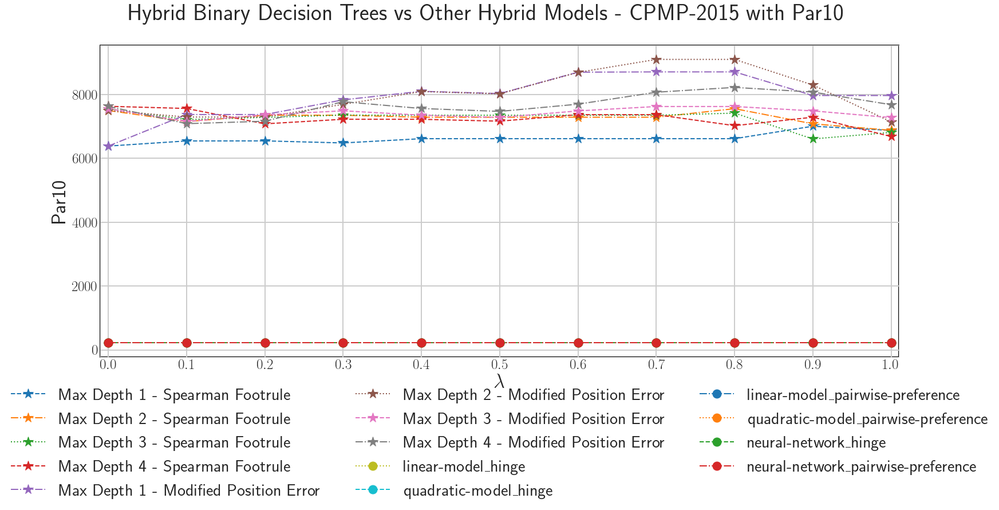

{'linear-model_hinge': {0.0: 547.5691448450348, 0.1: 537.9082710309931, 0.2: 526.3834974699557, 0.3: 521.8371239721695, 0.4: 523.6039392789373, 0.5: 521.9126457938013, 0.6: 524.8222014547755, 0.7: 524.6638823529412, 0.8: 525.320123023403, 0.9: 519.3797621758381, 1.0: 524.4444060721063}, 'quadratic-model_hinge': {0.0: 498.72690733712835, 0.1: 469.1815072738773, 0.2: 461.7496287160025, 0.3: 471.85348418722333, 0.4: 488.63885072738776, 0.5: 487.06969512966475, 0.6: 481.5701138519924, 0.7: 485.3101900695762, 0.8: 497.9495221378874, 0.9: 503.36874067046176, 1.0: 517.8395063251106}, 'linear-model_pairwise-preference': {0.0: 552.1151037318153, 0.1: 536.1476824794435, 0.2: 537.3939358001265, 0.3: 527.7044601518027, 0.4: 519.5992896900696, 0.5: 515.1925749525617, 0.6: 512.3666268184694, 0.7: 509.6322305502846, 0.8: 508.5266072106262, 0.9: 509.5116578115118, 1.0: 523.6884886148008}, 'quadratic-model_pairwise-preference': {0.0: 514.7640091714105, 0.1: 479.24164326375706, 0.2: 467.77911258697026, 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

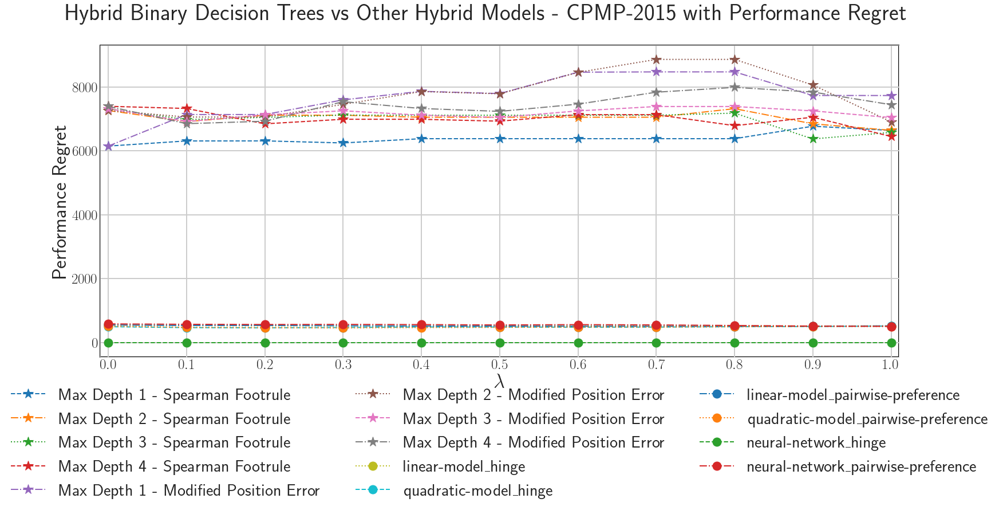

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

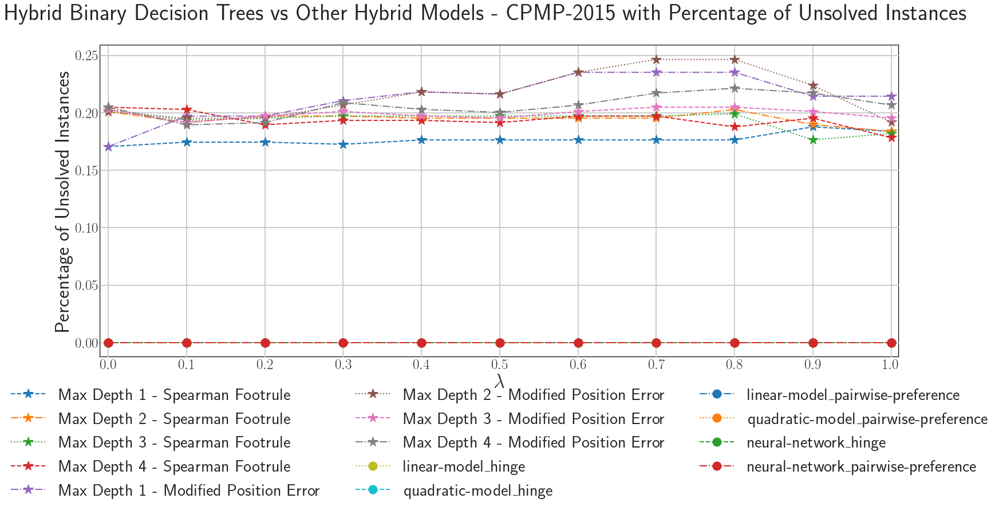

{'linear-model_hinge': {0.0: 0.8740156927227921, 0.1: 0.8843602152415814, 0.2: 0.8898574210476, 0.3: 0.8929145465613166, 0.4: 0.8942855250381717, 0.5: 0.8948792721389124, 0.6: 0.8950504760676536, 0.7: 0.8951642192600542, 0.8: 0.8950856700687152, 0.9: 0.8957496912037504, 1.0: 0.8954744348256449}, 'quadratic-model_hinge': {0.0: 0.8719098700567498, 0.1: 0.8846881969444091, 0.2: 0.8942728626110916, 0.3: 0.8974573297537273, 0.4: 0.8976978147918514, 0.5: 0.897550015121267, 0.6: 0.8978181833019306, 0.7: 0.897037993849426, 0.8: 0.8954149628107154, 0.9: 0.8934648361567761, 1.0: 0.8909578944880181}, 'linear-model_pairwise-preference': {0.0: 0.8716404634680146, 0.1: 0.8812249817827897, 0.2: 0.8862231005814738, 0.3: 0.8900136954603458, 0.4: 0.8927861315600467, 0.5: 0.8949038226552426, 0.6: 0.8960922503892411, 0.7: 0.896566787219606, 0.8: 0.8970160430248036, 0.9: 0.897138634012654, 1.0: 0.8941568026679617}, 'quadratic-model_pairwise-preference': {0.0: 0.8696499269906366, 0.1: 0.8800309168792059, 0.

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

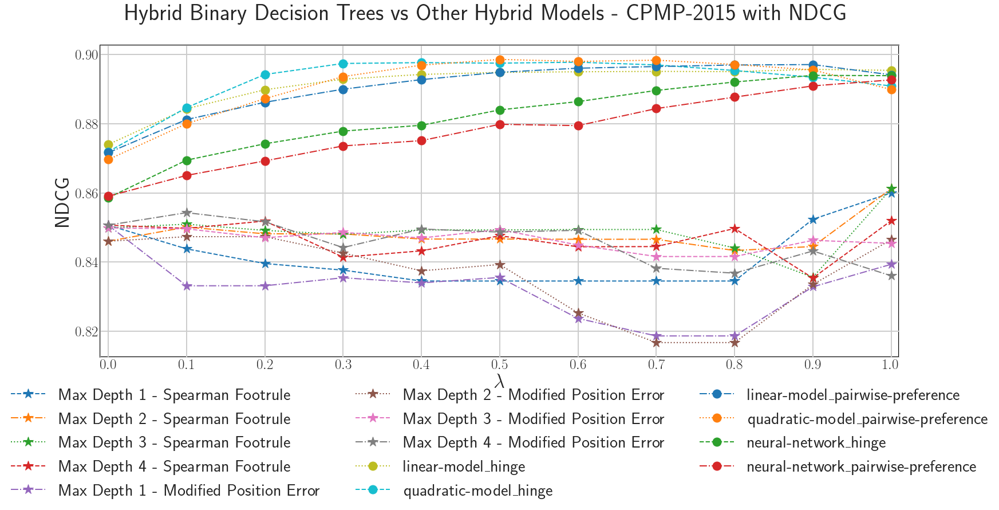

{'linear-model_hinge': {0.0: 5282.892077253822, 0.1: 4571.303891244648, 0.2: 3756.061370449541, 0.3: 3431.434917314985, 0.4: 3374.7276602660554, 0.5: 3264.3132452048926, 0.6: 3157.880728308868, 0.7: 3155.386006672783, 0.8: 3049.053157819572, 0.9: 3156.7092990275232, 1.0: 3101.160081382263}, 'quadratic-model_hinge': {0.0: 6165.61636530428, 0.1: 5354.015300243119, 0.2: 4969.662369685016, 0.3: 4754.861766779816, 0.4: 4533.368958446484, 0.5: 4529.475195373088, 0.6: 4368.344157070336, 0.7: 4528.995961351682, 0.8: 4744.770634883792, 0.9: 4911.054457727828, 1.0: 4701.899632941896}, 'linear-model_pairwise-preference': {0.0: 5337.566797666667, 0.1: 4730.77728658104, 0.2: 4353.488239792049, 0.3: 3966.2225912446484, 0.4: 3317.060480617737, 0.5: 3152.3565838287464, 0.6: 3208.6512404801224, 0.7: 3154.653504394496, 0.8: 3313.9829461376144, 0.9: 3263.3793866574924, 1.0: 4138.656076183486}, 'quadratic-model_pairwise-preference': {0.0: 6000.539460105504, 0.1: 5619.287146038227, 0.2: 5079.201565862385, 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

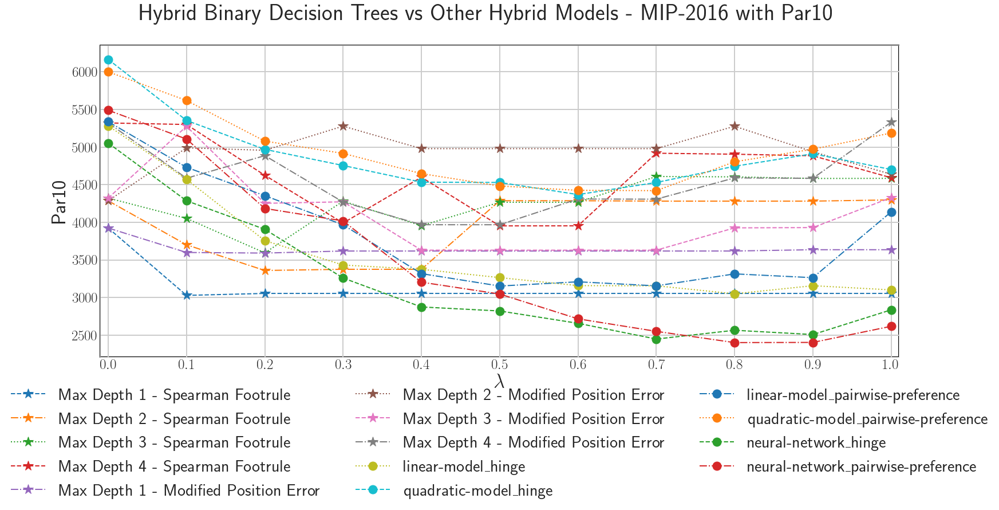

{'linear-model_hinge': {0.0: 596.0749235474007, 0.1: 503.57874617737, 0.2: 426.08715596330273, 0.3: 393.06727828746176, 0.4: 380.97094801223244, 0.5: 364.47400611620793, 0.6: 362.59327217125383, 0.7: 364.5214067278287, 0.8: 347.9418960244648, 0.9: 356.841743119266, 1.0: 349.8478593272171}, 'quadratic-model_hinge': {0.0: 681.151376146789, 0.1: 605.2400611620795, 0.2: 561.9717125382263, 0.3: 535.2010703363915, 0.4: 514.1819571865443, 0.5: 502.25, 0.6: 494.03058103975536, 0.7: 494.23853211009174, 0.8: 523.7951070336392, 0.9: 536.9724770642201, 1.0: 554.2071865443426}, 'linear-model_pairwise-preference': {0.0: 589.6253822629969, 0.1: 517.0680428134557, 0.2: 486.0183486238532, 0.3: 439.50688073394497, 0.4: 388.97782874617735, 0.5: 370.5948012232416, 0.6: 363.3891437308869, 0.7: 354.6536697247706, 0.8: 368.6085626911315, 0.9: 362.0229357798165, 1.0: 425.348623853211}, 'quadratic-model_pairwise-preference': {0.0: 669.6001529051988, 0.1: 629.4954128440367, 0.2: 581.8501529051988, 0.3: 556.9839

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

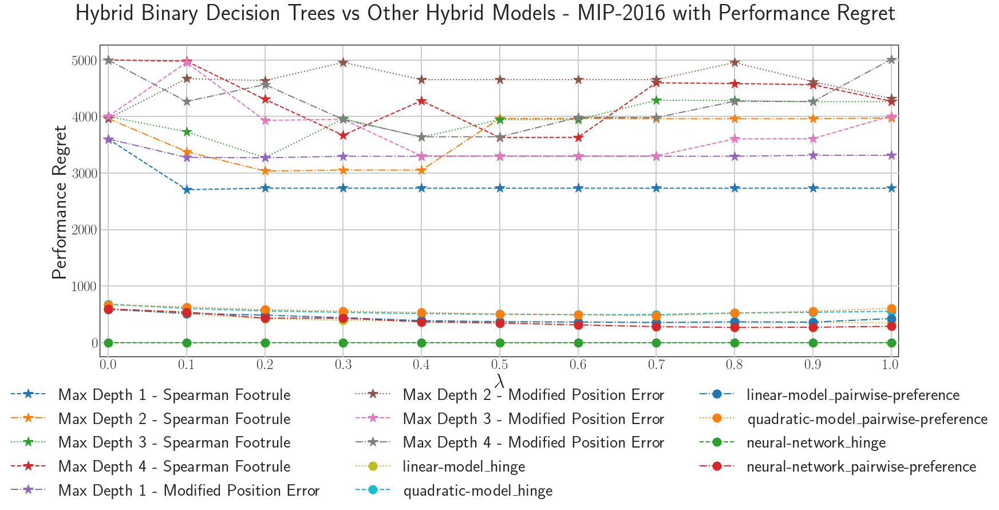

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

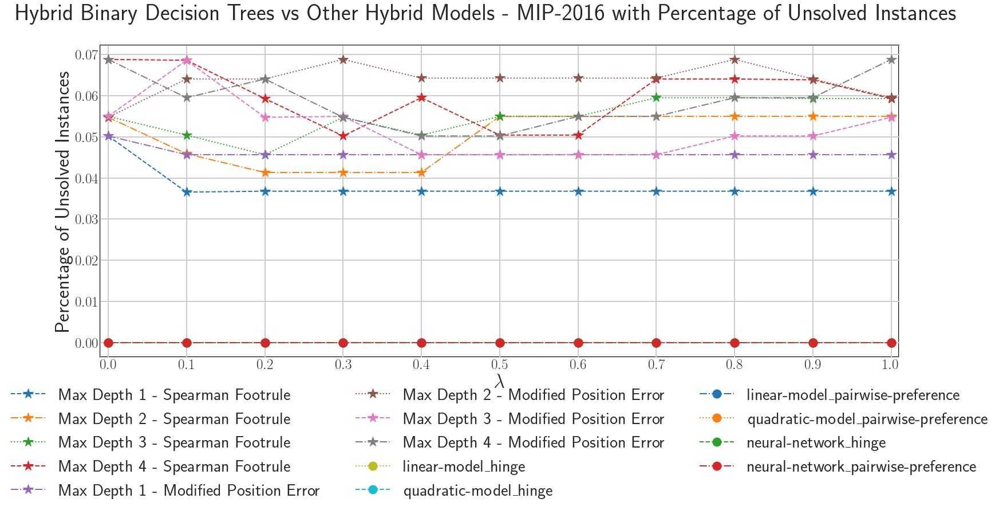

{'linear-model_hinge': {0.0: 0.9482136851657834, 0.1: 0.9557357540467504, 0.2: 0.9611852797938747, 0.3: 0.9643045763684145, 0.4: 0.9649606113058471, 0.5: 0.9656947278332615, 0.6: 0.9663181496813028, 0.7: 0.9659946105245553, 0.8: 0.9669973235040725, 0.9: 0.9666018231626179, 1.0: 0.9669917365635742}, 'quadratic-model_hinge': {0.0: 0.9317677462507671, 0.1: 0.9409585323054162, 0.2: 0.9461437445333, 0.3: 0.9498402304308926, 0.4: 0.9507027287377791, 0.5: 0.9518493623378362, 0.6: 0.9525591354064606, 0.7: 0.9524083445859255, 0.8: 0.9515592764755697, 0.9: 0.9503522686591026, 1.0: 0.946091057407293}, 'linear-model_pairwise-preference': {0.0: 0.9460655997441019, 0.1: 0.9540829796687207, 0.2: 0.9584915887456827, 0.3: 0.9611847453115843, 0.4: 0.964514252755645, 0.5: 0.9659633805897233, 0.6: 0.9673382624428497, 0.7: 0.9679567799723403, 0.8: 0.9680965351719871, 0.9: 0.9695922818069891, 1.0: 0.9584114390300289}, 'quadratic-model_pairwise-preference': {0.0: 0.9318321461805514, 0.1: 0.9377297405026118, 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

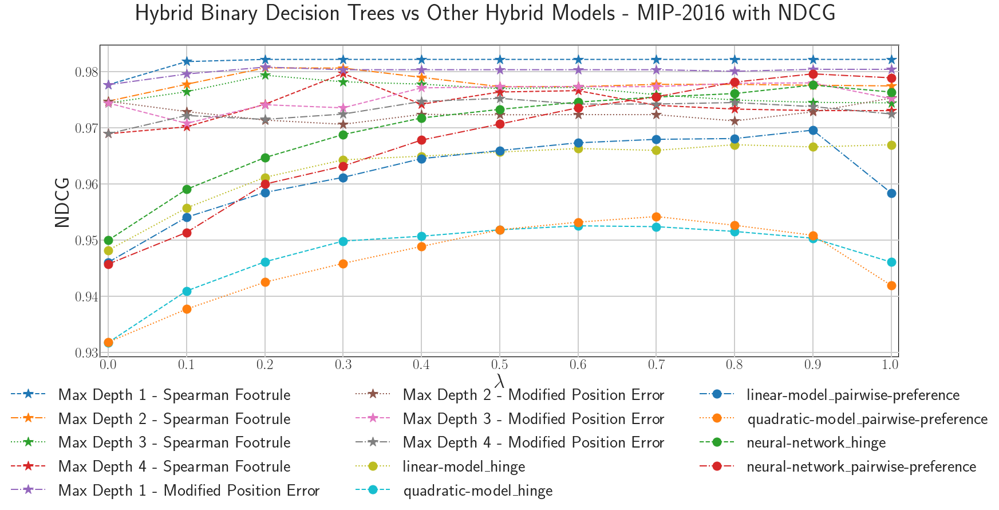

{'linear-model_hinge': {0.0: 107.71566470299265, 0.1: 107.71566470299265, 0.2: 107.71566470299265, 0.3: 107.71566470299265, 0.4: 107.71566470299265, 0.5: 107.71566470299265, 0.6: 107.71566470299265, 0.7: 107.71566470299265, 0.8: 107.71566470299265, 0.9: 107.71566470299265, 1.0: 107.71566470299265}, 'quadratic-model_hinge': {0.0: 107.71566470299265, 0.1: 107.71566470299265, 0.2: 107.71566470299265, 0.3: 107.71566470299265, 0.4: 107.71566470299265, 0.5: 107.71566470299265, 0.6: 107.71566470299265, 0.7: 107.71566470299265, 0.8: 107.71566470299265, 0.9: 107.71566470299265, 1.0: 107.71566470299265}, 'linear-model_pairwise-preference': {0.0: 107.71566470299265, 0.1: 107.71566470299265, 0.2: 107.71566470299265, 0.3: 107.71566470299265, 0.4: 107.71566470299265, 0.5: 107.71566470299265, 0.6: 107.71566470299265, 0.7: 107.71566470299265, 0.8: 107.71566470299265, 0.9: 107.71566470299265, 1.0: 107.71566470299265}, 'quadratic-model_pairwise-preference': {0.0: 107.71566470299265, 0.1: 107.71566470299

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

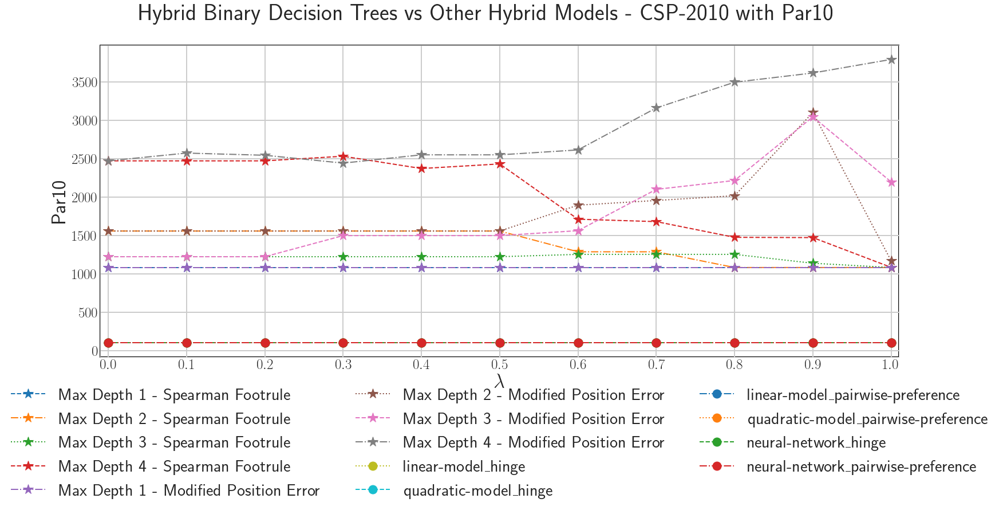

{'linear-model_hinge': {0.0: 43.2731441767363, 0.1: 28.394436732354606, 0.2: 19.481330208921513, 0.3: 16.649434568040657, 0.4: 14.337279305477134, 0.5: 19.98372934500283, 0.6: 19.983051866741956, 0.7: 25.6295250513834, 0.8: 28.498860644833425, 0.9: 28.498846531902878, 1.0: 26.358946070016938}, 'quadratic-model_hinge': {0.0: 33.08621960982496, 0.1: 15.271058453980803, 0.2: 12.844091849237717, 0.3: 10.107474513833992, 0.4: 10.107187712027104, 0.5: 10.107521933370975, 0.6: 12.930433902879729, 0.7: 15.721297726708075, 0.8: 21.4701959068323, 0.9: 13.000225295878035, 1.0: 7.357377191417277}, 'linear-model_pairwise-preference': {0.0: 39.09667513495201, 0.1: 37.031499487295314, 0.2: 28.338317578204407, 0.3: 27.82682793167702, 0.4: 25.113863674195372, 0.5: 19.639484728966682, 0.6: 25.285860808582722, 0.7: 28.11392727611519, 0.8: 25.801222129870126, 0.9: 25.86877820440429, 1.0: 26.441218098249575}, 'quadratic-model_pairwise-preference': {0.0: 35.969453494071146, 0.1: 16.712088719932243, 0.2: 13.

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

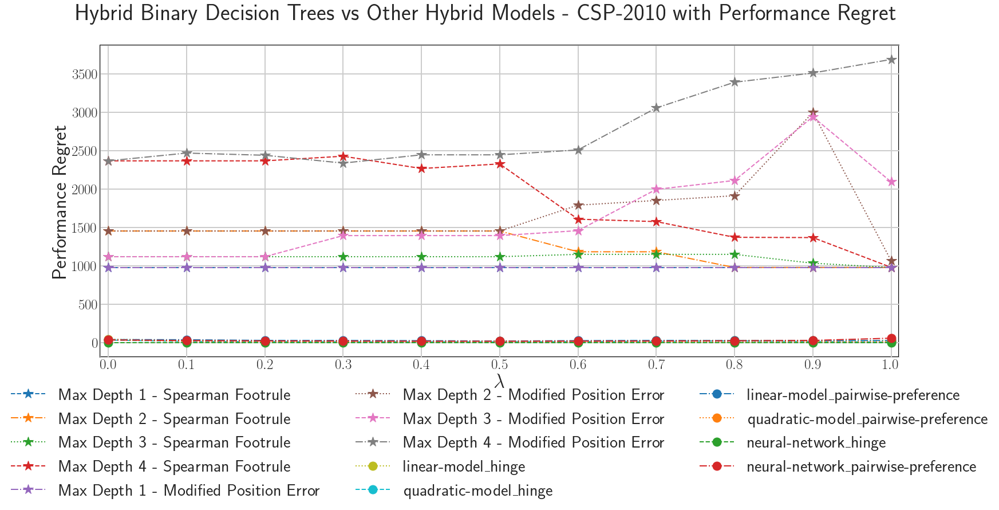

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

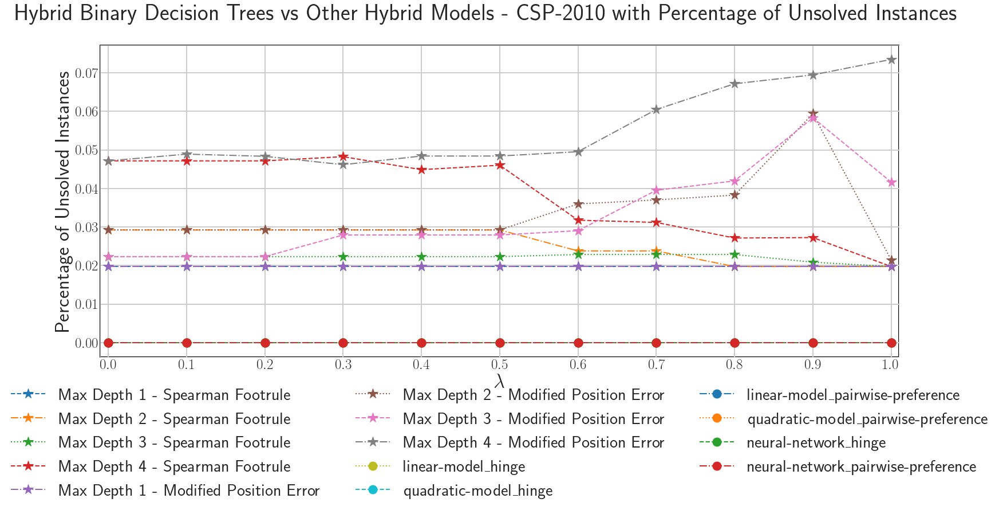

{'linear-model_hinge': {0.0: 0.9172343227812016, 0.1: 0.947660215485079, 0.2: 0.9534953181954117, 0.3: 0.954537300822257, 0.4: 0.9562044730252091, 0.5: 0.9566212660759471, 0.6: 0.9572464556520542, 0.7: 0.9566212660759471, 0.8: 0.9568296626013162, 0.9: 0.9566212660759471, 1.0: 0.955787679974471}, 'quadratic-model_hinge': {0.0: 0.8907679640593353, 0.1: 0.9522449390431976, 0.2: 0.9524533355685667, 0.3: 0.9537037147207809, 0.4: 0.9537037147207809, 0.5: 0.9537037147207809, 0.6: 0.9541205077715189, 0.7: 0.954537300822257, 0.8: 0.954537300822257, 0.9: 0.955162490398364, 1.0: 0.9570380591266852}, 'linear-model_pairwise-preference': {0.0: 0.9097320478679164, 0.1: 0.9432838884523295, 0.2: 0.9512029564163526, 0.3: 0.9524533355685665, 0.4: 0.955162490398364, 0.5: 0.9559960764998401, 0.6: 0.9566212660759471, 0.7: 0.9562044730252091, 0.8: 0.9564128695505781, 0.9: 0.955370886923733, 1.0: 0.9562044730252091}, 'quadratic-model_pairwise-preference': {0.0: 0.8922267397369185, 0.1: 0.946409836332865, 0.2:

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

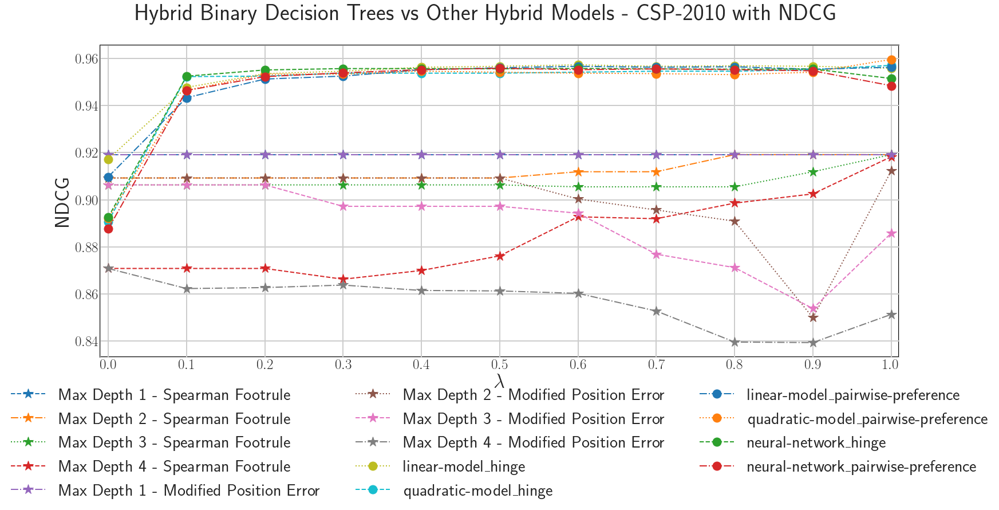

{'linear-model_hinge': {0.0: 12535.144275093608, 0.1: 12205.628784161341, 0.2: 11986.124515301372, 0.3: 11615.757402313548, 0.4: 11356.769052515221, 0.5: 11170.739150406393, 0.6: 11466.70068349315, 0.7: 11585.133015642314, 0.8: 11447.222215436836, 0.9: 11527.35409051598, 1.0: 11238.18994606469}, 'quadratic-model_hinge': {0.0: 11985.262420925419, 0.1: 11357.025978692542, 0.2: 11068.017438891173, 0.3: 11142.97585086149, 0.4: 11453.841642254187, 0.5: 11525.897166909437, 0.6: 11528.85886405936, 0.7: 11192.328358281582, 0.8: 11358.74555852283, 0.9: 11284.535615179604, 1.0: 9679.220940135463}, 'linear-model_pairwise-preference': {0.0: 14922.004989812025, 0.1: 11446.836681369103, 0.2: 11295.91299335312, 0.3: 10888.754325156011, 0.4: 10484.105114986301, 0.5: 10226.510218385083, 0.6: 10038.435103061644, 0.7: 10146.421124917048, 0.8: 9705.299303373667, 0.9: 9303.819358832572, 1.0: 10915.94475616971}, 'quadratic-model_pairwise-preference': {0.0: 11986.613033398782, 0.1: 11651.253820620244, 0.2: 1

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

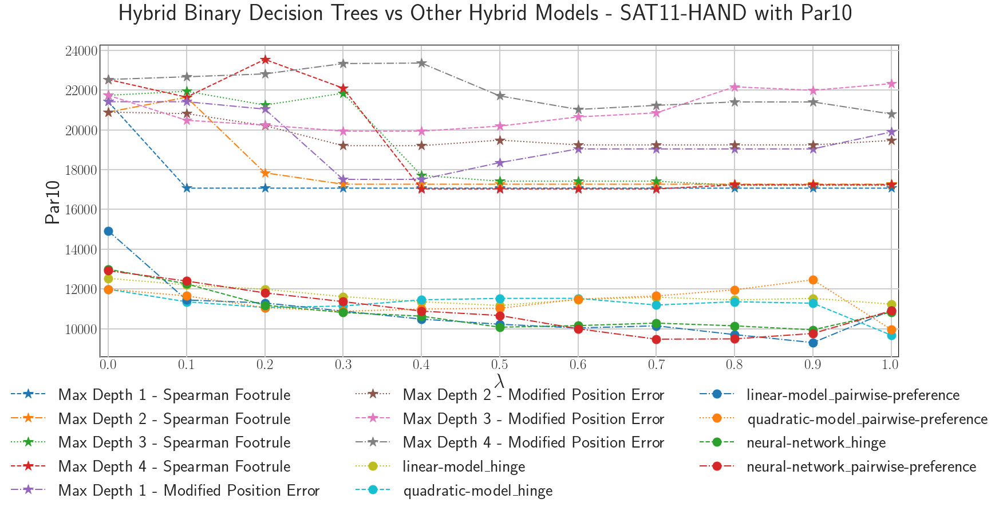

{'linear-model_hinge': {0.0: 1138.1676086826485, 0.1: 1111.1939525707764, 0.2: 1084.9333658165906, 0.3: 1062.2068022176559, 0.4: 1035.5573023424656, 0.5: 1015.184868480974, 0.6: 1036.1549895289195, 0.7: 1042.6188997564689, 0.8: 1050.6072388409436, 0.9: 1065.2796915053273, 1.0: 1071.697358587519}, 'quadratic-model_hinge': {0.0: 1116.345306347032, 0.1: 1065.183969998478, 0.2: 1052.5150960509893, 0.3: 1045.2931904391173, 0.4: 1074.7467375936073, 0.5: 1076.7885199680366, 0.6: 1083.0325267435312, 0.7: 1065.591352302892, 0.8: 1081.558773914003, 0.9: 1095.6859517929986, 1.0: 954.3847448980213}, 'linear-model_pairwise-preference': {0.0: 1368.7244255601217, 0.1: 1051.5426892983257, 0.2: 1023.9082620799087, 0.3: 988.7426615372907, 0.4: 960.3626027229833, 0.5: 935.8066439109589, 0.6: 912.0459945060882, 0.7: 920.6465898135463, 0.8: 885.878617391933, 0.9: 864.9501386156774, 1.0: 1014.168817979452}, 'quadratic-model_pairwise-preference': {0.0: 1126.9444653972603, 0.1: 1081.9122655266362, 0.2: 1045.2

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

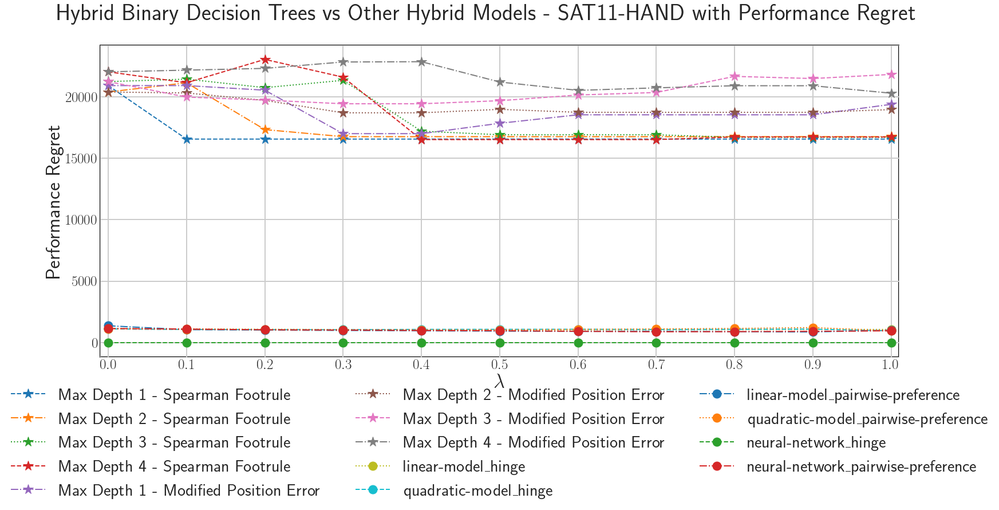

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

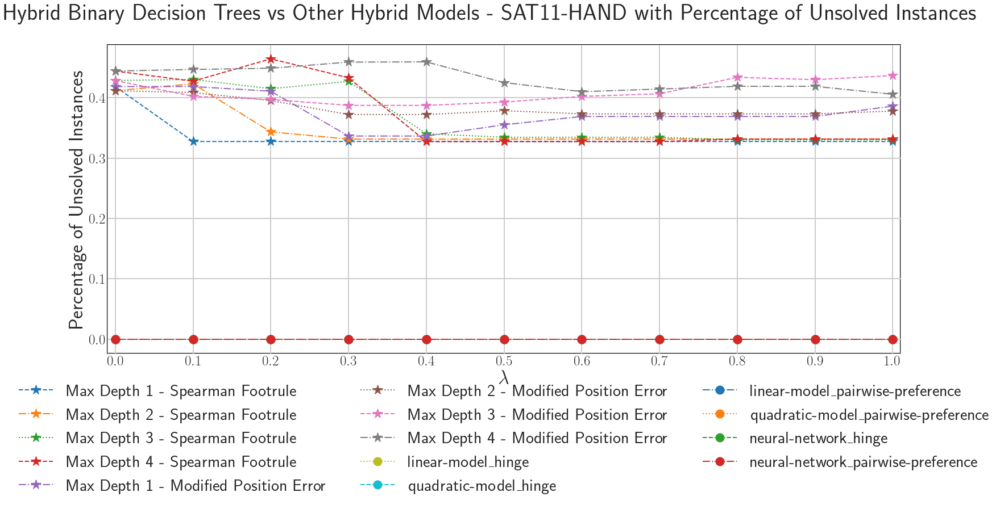

{'linear-model_hinge': {0.0: 0.8416839555182591, 0.1: 0.8509771353213065, 0.2: 0.8551871228387119, 0.3: 0.8567758771401798, 0.4: 0.858558134509073, 0.5: 0.8597497744181313, 0.6: 0.8578061631057152, 0.7: 0.8572215866486194, 0.8: 0.8565733523606773, 0.9: 0.8550099206613503, 1.0: 0.8577112981157071}, 'quadratic-model_hinge': {0.0: 0.8402632664671325, 0.1: 0.8492066361763179, 0.2: 0.8519052415103333, 0.3: 0.8514687731564976, 0.4: 0.8506483765817332, 0.5: 0.8488067575294663, 0.6: 0.8491971436546107, 0.7: 0.8477735678796615, 0.8: 0.848546770107162, 0.9: 0.8489714905731747, 1.0: 0.8658031777122634}, 'linear-model_pairwise-preference': {0.0: 0.8200899605343301, 0.1: 0.8553001801989248, 0.2: 0.8603169398024069, 0.3: 0.8654264562478556, 0.4: 0.8696165312241848, 0.5: 0.8722269177109628, 0.6: 0.874442461548021, 0.7: 0.8745720123636572, 0.8: 0.875870998107035, 0.9: 0.8788182406729773, 1.0: 0.8558469705221391}, 'quadratic-model_pairwise-preference': {0.0: 0.8394634616282586, 0.1: 0.8464215427081715,

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

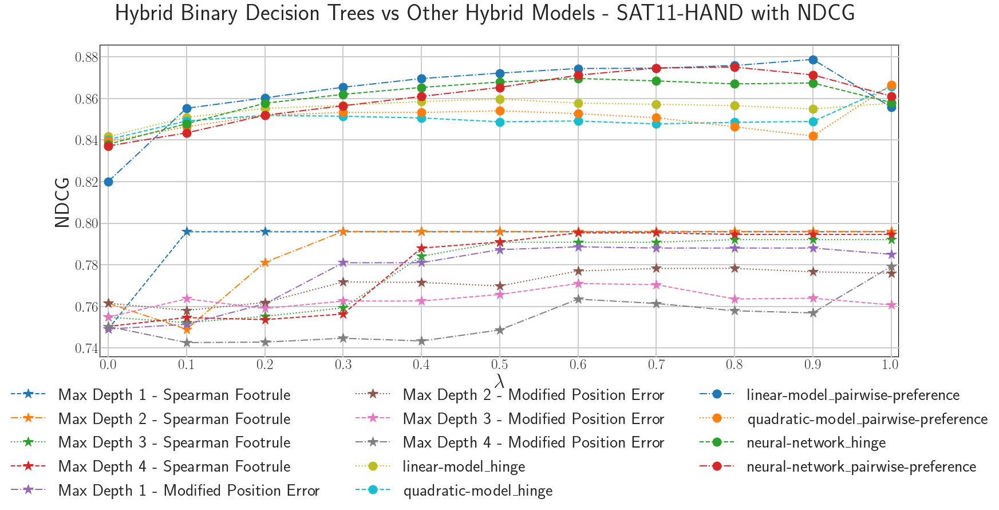

{'linear-model_hinge': {0.0: 10290.151498862977, 0.1: 10094.239528370224, 0.2: 10160.02543739328, 0.3: 9965.792467725296, 0.4: 10029.512164005928, 0.5: 9862.26915363307, 0.6: 9735.282006327405, 0.7: 10058.648722526352, 0.8: 10287.79898275033, 0.9: 9904.660991116602, 1.0: 8739.934477721345}, 'quadratic-model_hinge': {0.0: 8903.032295869565, 0.1: 8544.927594018445, 0.2: 8445.596059696969, 0.3: 8574.031689538868, 0.4: 8475.610160685112, 0.5: 8441.205789802372, 0.6: 8474.927527944665, 0.7: 8703.187073583003, 0.8: 8445.591202897891, 0.9: 8441.024800071804, 1.0: 8154.236156467061}, 'linear-model_pairwise-preference': {0.0: 10449.638342854414, 0.1: 9993.030323370223, 0.2: 9929.838172650856, 0.3: 9895.773703289855, 0.4: 9536.701060529644, 0.5: 9567.735693861661, 0.6: 9341.456097023714, 0.7: 9214.368094689064, 0.8: 9182.349957435443, 0.9: 8604.613949662054, 1.0: 8672.777434764823}, 'quadratic-model_pairwise-preference': {0.0: 9060.193687177207, 0.1: 8675.195267144269, 0.2: 8543.97935146245, 0.3

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

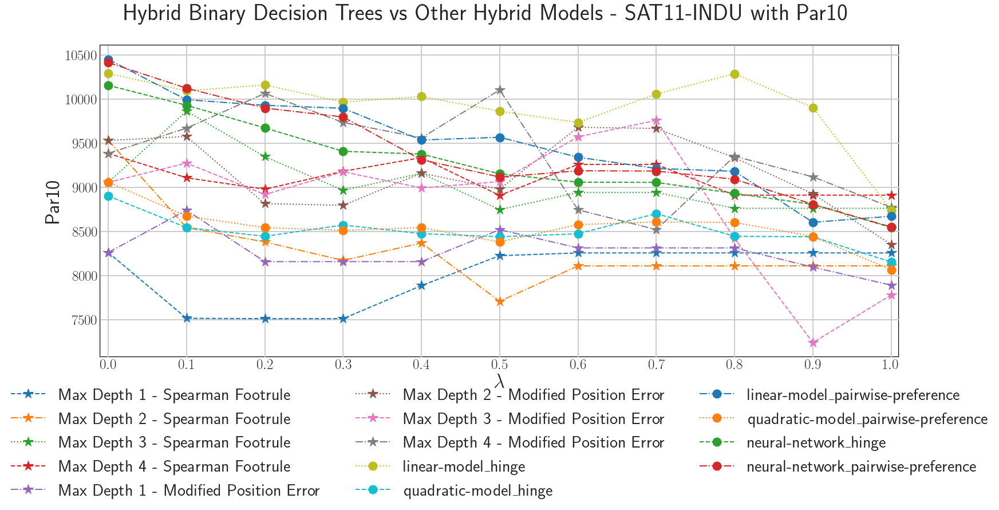

{'linear-model_hinge': {0.0: 1056.6107397187088, 0.1: 1041.823622110672, 0.2: 1037.5006157496705, 0.3: 1017.452440873518, 0.4: 1020.7314306007905, 0.5: 998.2658828722002, 0.6: 984.5384255395257, 0.7: 997.3615592793149, 0.8: 1010.455819179842, 0.9: 974.5014947951252, 1.0: 888.1324102924902}, 'quadratic-model_hinge': {0.0: 882.2466605375495, 0.1: 860.9908378899868, 0.2: 834.5269294499341, 0.3: 838.6966692575758, 0.4: 823.7339802022396, 0.5: 824.7724792035573, 0.6: 832.8365818372858, 0.7: 850.0334223293809, 0.8: 837.9465079222662, 0.9: 850.2423136719367, 1.0: 842.340533540843}, 'linear-model_pairwise-preference': {0.0: 1071.2596877088272, 0.1: 1010.3129714380765, 0.2: 1018.8548028326746, 0.3: 1012.8950268985507, 0.4: 968.5185460335967, 0.5: 962.2892701607378, 0.6: 939.5646401086957, 0.7: 937.9535762200263, 0.8: 910.4980237187087, 0.9: 871.9799017806323, 1.0: 858.4961757898551}, 'quadratic-model_pairwise-preference': {0.0: 884.8688745533597, 0.1: 872.5344685085639, 0.2: 853.0525040711464, 

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

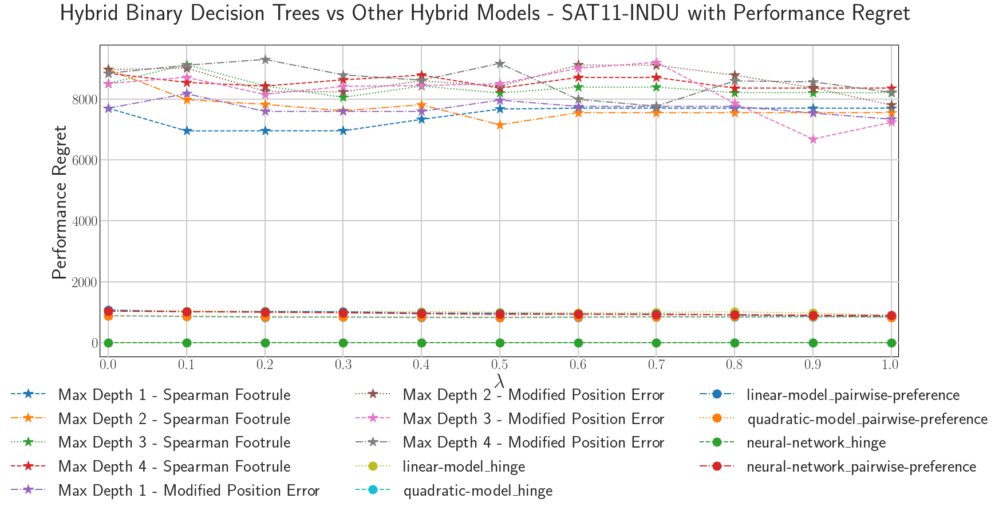

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

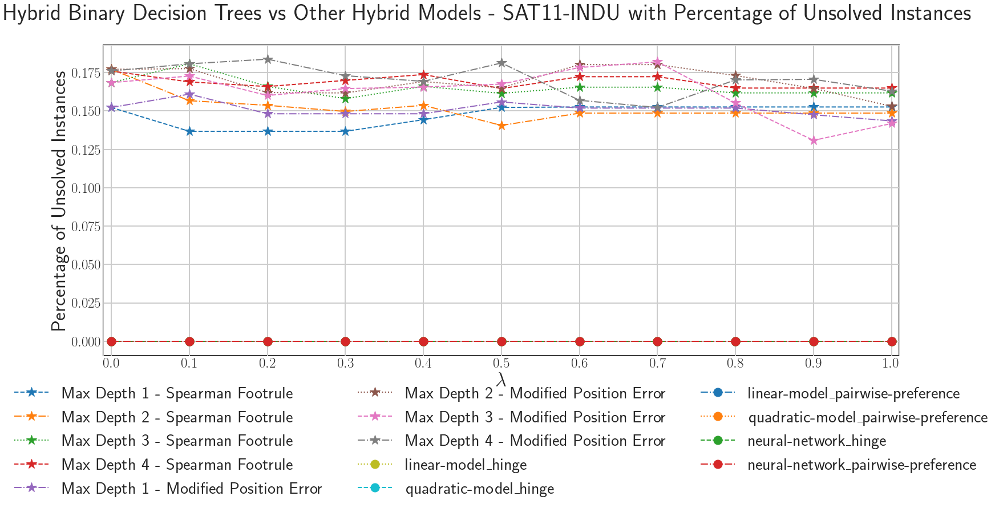

{'linear-model_hinge': {0.0: 0.8288585255940784, 0.1: 0.833077693396246, 0.2: 0.8356556697977139, 0.3: 0.8379323397107777, 0.4: 0.838661864468054, 0.5: 0.8397188389317891, 0.6: 0.8406097035859547, 0.7: 0.8408353043595328, 0.8: 0.841335713834217, 0.9: 0.8432296036448762, 1.0: 0.8452949534196958}, 'quadratic-model_hinge': {0.0: 0.8376484955120321, 0.1: 0.8411278726853475, 0.2: 0.8441828839963219, 0.3: 0.8451839783483035, 0.4: 0.8462584981591929, 0.5: 0.8466502821633504, 0.6: 0.8469370695284851, 0.7: 0.8472084841687252, 0.8: 0.84837859609714, 0.9: 0.8485665281874436, 1.0: 0.8514435860108308}, 'linear-model_pairwise-preference': {0.0: 0.8253349986255358, 0.1: 0.8340827497857447, 0.2: 0.8363665861856151, 0.3: 0.839097207169207, 0.4: 0.8423080773149718, 0.5: 0.8437782604202887, 0.6: 0.8447073896397895, 0.7: 0.8459635201862521, 0.8: 0.8476718381820252, 0.9: 0.8497627368122403, 1.0: 0.8456534554575481}, 'quadratic-model_pairwise-preference': {0.0: 0.8374454969757934, 0.1: 0.8397976157939188, 0

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

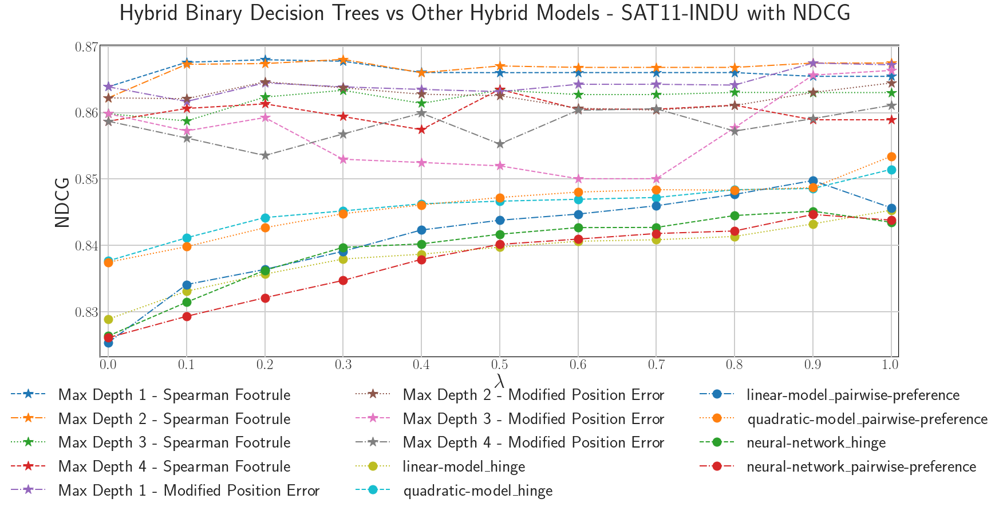

{'linear-model_hinge': {0.0: 3117.1412947899726, 0.1: 3203.950024889566, 0.2: 3508.371028136857, 0.3: 3897.894454180217, 0.4: 4101.7204011178865, 0.5: 4307.3630739634145, 0.6: 4511.825122873306, 0.7: 4886.707701357724, 0.8: 5039.982182237805, 0.9: 5175.36107582859, 1.0: 4871.721219992548}, 'quadratic-model_hinge': {0.0: 3201.8434988953254, 0.1: 3356.8859323472216, 0.2: 3696.9443749200545, 0.3: 3902.5106355924795, 0.4: 4274.918800433266, 0.5: 4645.638781455623, 0.6: 5017.024800400068, 0.7: 5271.806428874323, 0.8: 5609.175736789634, 0.9: 5898.485800468497, 1.0: 5918.447646664973}, 'linear-model_pairwise-preference': {0.0: 3322.962259928862, 0.1: 2914.3454061368566, 0.2: 3048.774252953929, 0.3: 3034.3948421443088, 0.4: 3189.1156010704613, 0.5: 3392.1644929742547, 0.6: 3594.911913287263, 0.7: 3829.382159063008, 0.8: 4001.898396634147, 0.9: 4305.170173294038, 1.0: 4941.254126617886}, 'quadratic-model_pairwise-preference': {0.0: 3202.048463664973, 0.1: 3420.0643583126694, 0.2: 3305.788575951

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

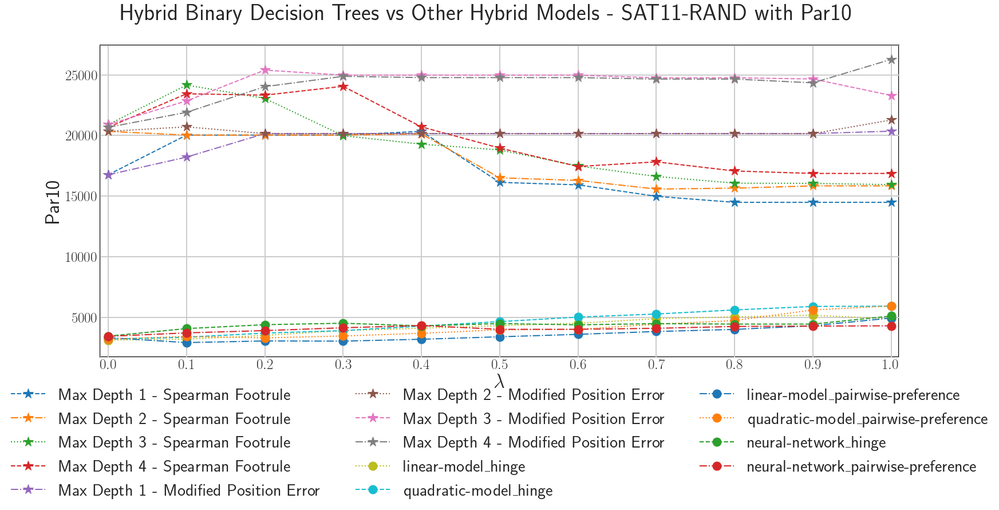

{'linear-model_hinge': {0.0: 260.2134823963415, 0.1: 260.48314638482384, 0.2: 280.1906900165989, 0.3: 316.8073731070461, 0.4: 334.2006366493902, 0.5: 358.18415604505424, 0.6: 380.2504485003388, 0.7: 418.7860013756775, 0.8: 433.486674229336, 0.9: 453.1037556280488, 1.0: 412.94841974220867}, 'quadratic-model_hinge': {0.0: 283.25910442140923, 0.1: 286.21406866124664, 0.2: 313.3213727520325, 0.3: 328.8521417296748, 0.4: 367.6985753434959, 0.5: 403.67108366497285, 0.6: 437.46934505724926, 0.7: 467.347665891599, 0.8: 498.7175304220867, 0.9: 532.5055241565041, 1.0: 535.1637312022358}, 'linear-model_pairwise-preference': {0.0: 287.93317315379403, 0.1: 231.34211060365854, 0.2: 239.70392200338753, 0.3: 237.40657481402437, 0.4: 249.4123437188347, 0.5: 262.99380644986456, 0.6: 277.92513954844173, 0.7: 298.8405046941057, 0.8: 316.6172239200542, 0.9: 345.5785620291328, 1.0: 428.98277959010835}, 'quadratic-model_pairwise-preference': {0.0: 283.1025130928184, 0.1: 290.78005287127365, 0.2: 278.38342415

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

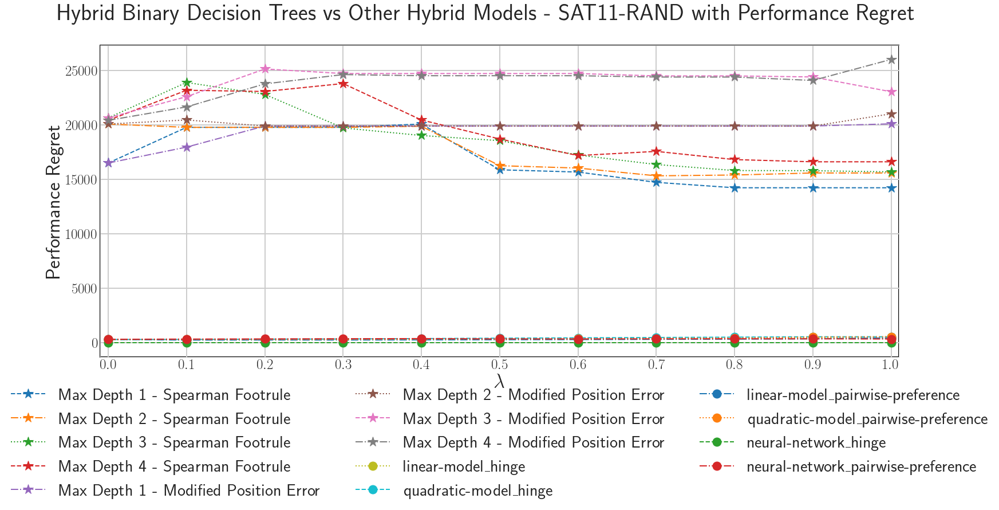

{'linear-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'linear-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'quadratic-model_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_hinge': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}, 'neural-network_pairwise-preference': {0.0: 0.0, 0.1: 0.0, 0.2: 0.0, 0.3: 0.0, 0.4: 0.0, 0.5: 0.0, 0.6: 0.0, 0.7: 0.0, 0.8: 0.0, 0.9: 0.0, 1.0: 0.0}}


c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

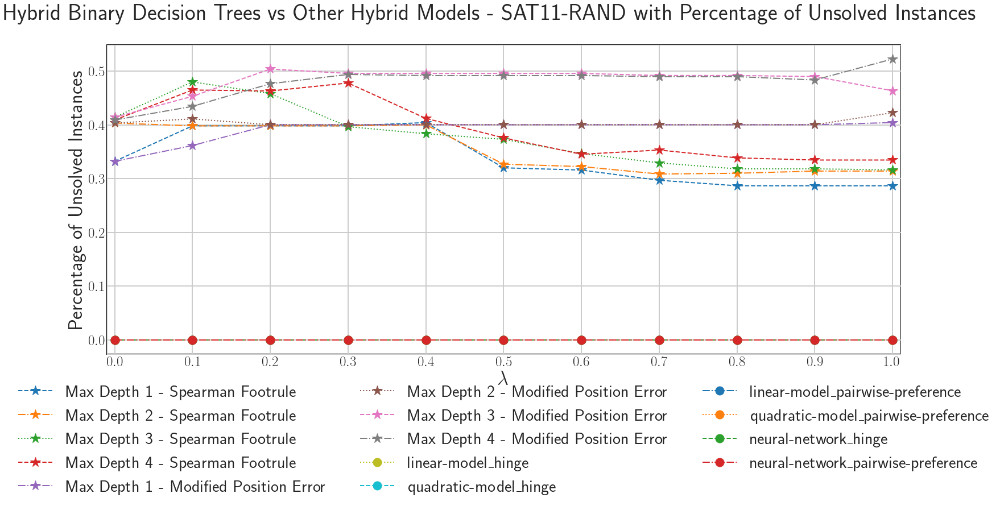

{'linear-model_hinge': {0.0: 0.9302666861381211, 0.1: 0.9323019496018397, 0.2: 0.9323215967876375, 0.3: 0.9311950941728634, 0.4: 0.9305637591808369, 0.5: 0.9284224099127584, 0.6: 0.9265000464077457, 0.7: 0.9240537071933026, 0.8: 0.9224852304071103, 0.9: 0.9212602337059379, 1.0: 0.9245081055485513}, 'quadratic-model_hinge': {0.0: 0.9294205355838112, 0.1: 0.9305898731335398, 0.2: 0.929808201325136, 0.3: 0.9294279964131057, 0.4: 0.9271186094821492, 0.5: 0.9244888024726619, 0.6: 0.9220254733997032, 0.7: 0.9193499859102737, 0.8: 0.9167671658110653, 0.9: 0.9139559392848613, 1.0: 0.913485162691148}, 'linear-model_pairwise-preference': {0.0: 0.9296115470992288, 0.1: 0.9322855263354369, 0.2: 0.9327249265304745, 0.3: 0.9340254427647158, 0.4: 0.9338074132829863, 0.5: 0.9330112964250313, 0.6: 0.9325156699192287, 0.7: 0.9306791473474992, 0.8: 0.9285119094603005, 0.9: 0.9261452548554834, 1.0: 0.9238533874550674}, 'quadratic-model_pairwise-preference': {0.0: 0.9290156805009011, 0.1: 0.930028011016322

c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesisAnalysis\evalaution_environment\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(
c:\Users\I3lac\Desktop\BachelorThesis

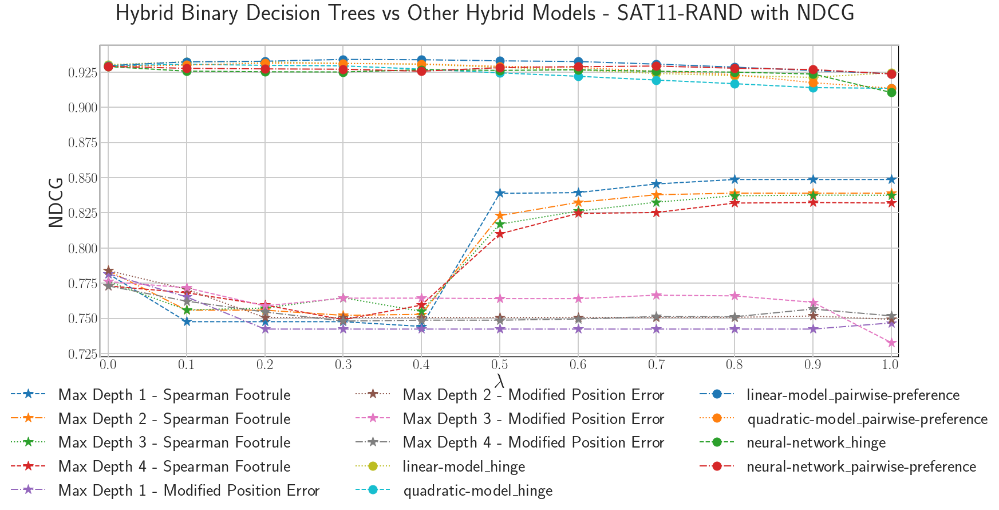

In [ ]:
scenario_names = ['CPMP-2015','MIP-2016','CSP-2010','SAT11-HAND','SAT11-INDU','SAT11-RAND']
ranking_losses = ['corrected_spearman_footrule','modified_position_error']
ranking_loss_names = ['Max Depth 1 - Spearman Footrule','Max Depth 2 - Spearman Footrule','Max Depth 3 - Spearman Footrule', 'Max Depth 4 - Spearman Footrule', 'Max Depth 1 - Modified Position Error','Max Depth 2 - Modified Position Error','Max Depth 3 - Modified Position Error', 'Max Depth 4 - Modified Position Error']
stopping_criteria = ['max_depth_1', 'max_depth_2', 'max_depth_3', 'max_depth_4']
for scenario_name in scenario_names:
    for metric_name in ['par10',  'performanceRegret','number_unsolved_instances_False', 'NDCG']:
        metric_name_graph = None
        sql_trees = [sql.format(ranking_loss, metric_name, scenario_name,stopping_criterion) for ranking_loss in ranking_losses for stopping_criterion in stopping_criteria]
        if metric_name == 'par10':
            metric_name_graph = 'Par10'
        if metric_name == 'performanceRegret':
            metric_name_graph = 'Performance Regret'
        if metric_name == 'number_unsolved_instances_False':
            metric_name_graph = 'Percentage of Unsolved Instances'
        if metric_name == 'NDCG':
            metric_name_graph = 'NDCG'
        title = f"Hybrid Binary Decision Trees vs Other Hybrid Models - {scenario_name} with {metric_name_graph}"
        print(data[scenario_name][metric_name])
        compare_losses_and_lambda(sql_trees, ranking_loss_names,r"$\lambda$", metric_name_graph,title, data[scenario_name][metric_name])
        plt.show()